# Reproducing Adam CDA Study (2018) - Exp2
### Notes

In [1]:
import numpy as np
import glob
import pickle
import pandas as pd
import copy
import scipy

import mne
from mne import Epochs, pick_channels, find_events
from mne.io import read_raw_eeglab

import os
import sys
#sys.path.append('/Users/nick/Documents/PhD/CLCT/reprod/studies/')
sys.path.append('D:\\PhD\\CDA-review\\studies\\')
from cda_utils import get_epochs, get_CDA, prep_report, fill_report, get_report, checksum, add_cda_report, get_CDA_perf_report
#sys.path.append('/Users/nick/Documents/PhD/CLCT/reprod/studies/Adam-2018/')
sys.path.append('D:\\PhD\\CDA-review\\studies\\Adam-2018')
from events import get_specific_events, convert_triggers
 
import matplotlib.pyplot as plt
%matplotlib inline

study_id = 'Adam2018-Exp2'

## 1. Load, Prep & CDA

Processing: 10_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/10_DWR_bilateral_ss6.fdt
Reading 0 ... 1839871  =      0.000 ...  7359.484 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/510 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/510 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/510 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/510 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.70 and n_interpolate=1


  0%|          | Repairing epochs : 0/510 [00:00<?,       ?it/s]

Dropped 13 epochs: 1, 79, 104, 117, 126, 161, 209, 220, 328, 385, 476, 478, 494


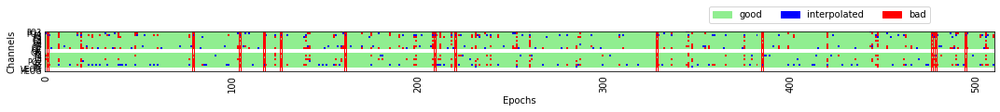

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[10_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -1.979601815554554
[10_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -3.5080328677644528
[10_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -2.7343117259567715
[10_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -2.735211997365907
[10_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -3

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 11_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/11_DWR_bilateral_ss6.fdt
Reading 0 ... 1688447  =      0.000 ...  6753.788 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 8 epochs: 6, 37, 183, 294, 304, 411, 480, 492


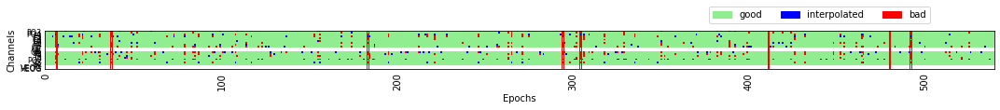

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[11_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -2.3207683102585084
[11_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -3.119729863015402
[11_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -1.9418315100192514
[11_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -2.155103109566977
[11_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -1

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 12_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/12_DWR_bilateral_ss6.fdt
Reading 0 ... 1546111  =      0.000 ...  6184.444 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.80 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 2 epochs: 0, 508


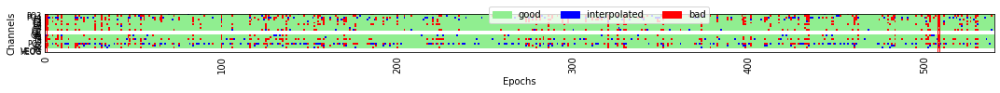

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[12_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -0.1397164041717296
[12_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -0.11424650783209013
[12_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -0.944807290386959
[12_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -1.0197936850474243
[12_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: 

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 2 epochs: 32, 336


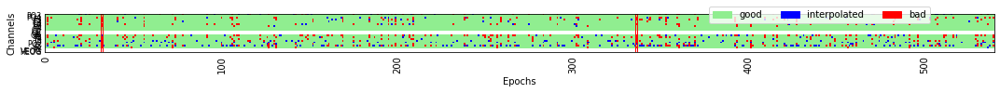

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[13_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -1.5198033902398502
[13_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -1.52882848728113
[13_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -0.8316832303065504
[13_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -0.8559748727765
[13_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -2.25

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:226: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-CDA'.format(perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:227: RuntimeWarning: Mean of empty slice
  print('Perf: {}, Mean: {}'.format(perf, np.nanmean(cda_means)))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:237: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:238: RuntimeWarning: Mean of empty slice
  print

Processing: 14_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/14_DWR_bilateral_ss6.fdt
Reading 0 ... 1994623  =      0.000 ...  7978.492 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 15 epochs: 53, 114, 267, 305, 311, 312, 343, 347, 378, 382, 434, 480, 481, 502, 522


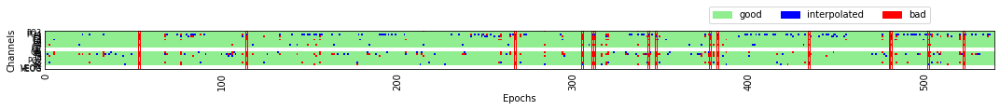

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[14_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -0.955470143474214
[14_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -0.5478707943075662
[14_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: 0.23567266399182174
[14_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -0.03445433287732433
[14_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: 

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 15_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/15_DWR_bilateral_ss6.fdt
Reading 0 ... 1719551  =      0.000 ...  6878.204 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 6 epochs: 14, 38, 273, 287, 290, 294


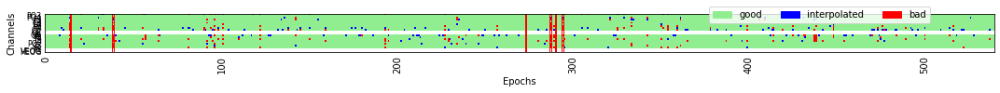

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[15_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 1.5421157704408508
[15_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: 0.25359295010381844
[15_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -0.8452534198513333
[15_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -0.7970207925450422
[15_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/451 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/451 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/451 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/451 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.90 and n_interpolate=1


  0%|          | Repairing epochs : 0/451 [00:00<?,       ?it/s]

Dropped 5 epochs: 8, 221, 235, 270, 290


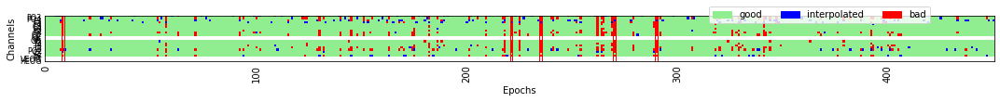

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[16_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 1.803355515062791
[16_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -1.3601447672854186
[16_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -0.4888649832858692
[16_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -1.5402405532965613
[16_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -2

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 17_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/17_DWR_bilateral_ss6.fdt
Reading 0 ... 1703039  =      0.000 ...  6812.156 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.20 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 93 epochs: 9, 16, 22, 24, 36, 38, 50, 54, 56, 57, 67, 77, 78, 81, 85, 87, 88, 91, 104, 106, 113, 116, 123, 125, 127, 134, 135, 138, 142, 155, 157, 160, 161, 162, 163, 167, 173, 175, 179, 181, 188, 190, 194, 204, 206, 218, 219, 227, 230, 231, 235, 237, 238, 241, 243, 244, 249, 254, 271, 276, 281, 283, 287, 292, 293, 307, 309, 324, 343, 353, 362, 366, 373, 374, 376, 378, 380, 382, 384, 405, 410, 422, 427, 428, 430, 442, 448, 451, 486, 504, 506, 520, 527


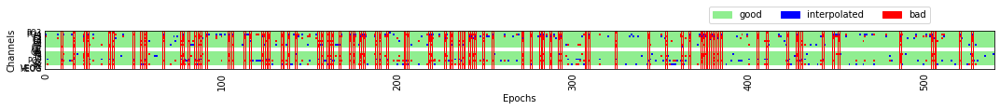

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[17_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -0.9798741789412821
[17_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: 0.2674231320465627
[17_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: 0.04039043660227959
[17_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -0.7321371550647746
[17_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: 0

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/105 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/105 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/105 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/105 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=4


  0%|          | Repairing epochs : 0/105 [00:00<?,       ?it/s]

Dropped 8 epochs: 2, 3, 45, 53, 59, 67, 69, 72


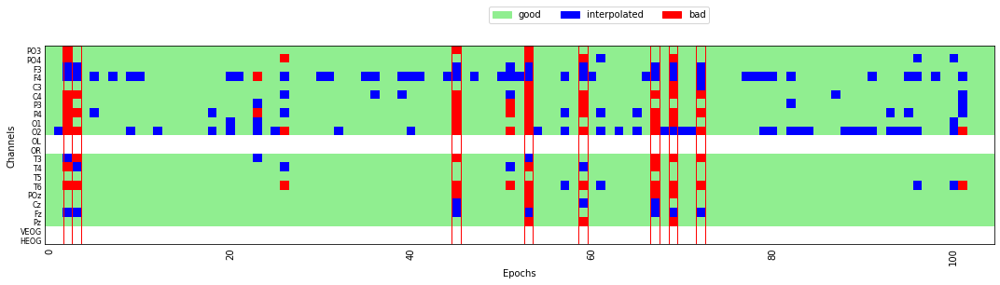

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[19_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -1.181918663875075
[19_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -1.18696503136473
[19_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -1.861661858703682
[19_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -0.3445796088152762
[19_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -3.7

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:226: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-CDA'.format(perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:227: RuntimeWarning: Mean of empty slice
  print('Perf: {}, Mean: {}'.format(perf, np.nanmean(cda_means)))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:237: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:238: RuntimeWarning: Mean of empty slice
  print

Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/1_DWR_bilateral_ss6.fdt
Reading 0 ... 1859583  =      0.000 ...  7438.332 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '13

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.80 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 9 epochs: 8, 91, 177, 183, 297, 330, 370, 378, 467


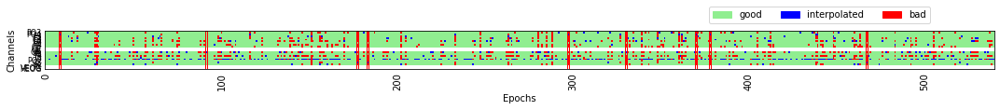

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[1_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 0.8443071160137935
[1_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -0.627766539139899
[1_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -0.30188600382663094
[1_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -0.5052548595575149
[1_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -0.102

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 11 epochs: 53, 73, 205, 227, 264, 278, 348, 422, 435, 484, 502


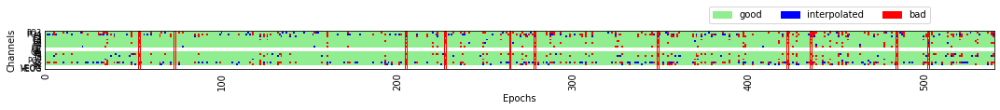

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[20_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 3.7124792847000934
[20_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: 3.890598714539255
[20_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: 3.508875348844667
[20_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: 4.622922658424619
[20_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: 4.20450

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/301 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/301 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/301 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/301 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=1


  0%|          | Repairing epochs : 0/301 [00:00<?,       ?it/s]

Dropped 56 epochs: 10, 24, 32, 51, 52, 55, 68, 72, 79, 82, 83, 84, 92, 104, 119, 131, 144, 153, 154, 162, 165, 171, 176, 177, 179, 180, 181, 182, 189, 194, 195, 197, 203, 204, 209, 210, 211, 215, 217, 218, 222, 228, 232, 235, 236, 237, 249, 257, 262, 269, 275, 279, 284, 285, 292, 300


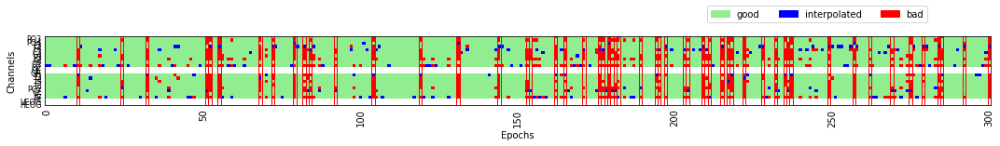

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[21_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -0.7190825049441508
[21_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -0.564695344116522
[21_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -0.32143650290803627
[21_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: 0.15224056462494437
[21_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: 

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 61 epochs: 1, 12, 17, 21, 29, 32, 34, 44, 45, 86, 92, 108, 111, 124, 135, 153, 158, 164, 167, 183, 188, 194, 202, 206, 216, 222, 223, 225, 228, 231, 232, 252, 257, 261, 263, 268, 272, 278, 279, 301, 306, 313, 335, 342, 343, 360, 372, 381, 389, 412, 417, 422, 431, 451, 481, 487, 503, 515, 520, 528, 529


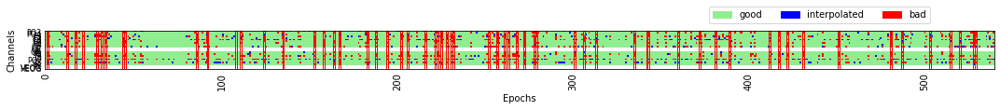

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[22_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -0.5800771328067329
[22_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -2.02526535254567
[22_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -2.6094650960625767
[22_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -2.1183690898104546
[22_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -1

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/420 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/420 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/420 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/420 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=1


  0%|          | Repairing epochs : 0/420 [00:00<?,       ?it/s]

Dropped 9 epochs: 85, 110, 113, 199, 218, 285, 324, 386, 412


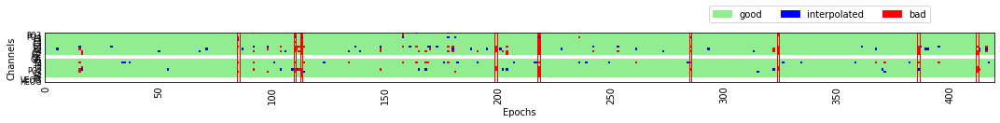

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[23_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -1.6689268318410384
[23_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -2.418925277072614
[23_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -2.3752415524946873
[23_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -1.3069846069581472
[23_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:226: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-CDA'.format(perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:227: RuntimeWarning: Mean of empty slice
  print('Perf: {}, Mean: {}'.format(perf, np.nanmean(cda_means)))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:237: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:238: RuntimeWarning: Mean of empty slice
  print

Processing: 24_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/24_DWR_bilateral_ss6.fdt
Reading 0 ... 1747839  =      0.000 ...  6991.356 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.


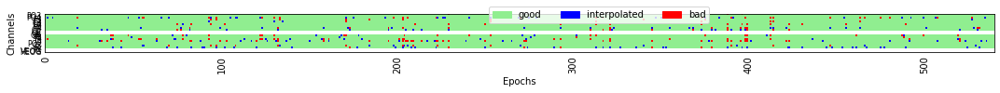

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[24_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -2.534475743698388
[24_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -3.888208264192743
[24_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -3.365591101505573
[24_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -3.0646884566426893
[24_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -4.

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:226: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-CDA'.format(perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:227: RuntimeWarning: Mean of empty slice
  print('Perf: {}, Mean: {}'.format(perf, np.nanmean(cda_means)))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:237: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:238: RuntimeWarning: Mean of empty slice
  print

Processing: 25_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/25_DWR_bilateral_ss6.fdt
Reading 0 ... 1778943  =      0.000 ...  7115.772 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.70 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 5 epochs: 257, 298, 431, 466, 534


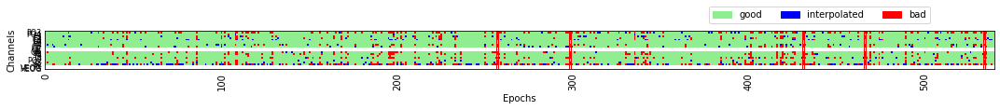

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[25_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -3.345348238088087
[25_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -1.5292983063018508
[25_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -0.3900132297799196
[25_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -0.06285818879810841
[25_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: 

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 26_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/26_DWR_bilateral_ss6.fdt
Reading 0 ... 1758847  =      0.000 ...  7035.388 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 11 epochs: 14, 18, 61, 144, 310, 322, 374, 383, 416, 417, 451


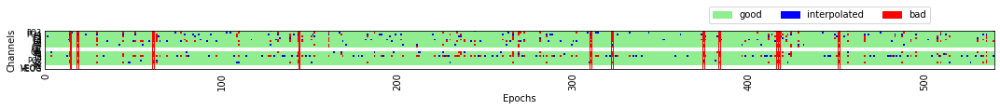

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[26_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 1.5728804192818577
[26_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -3.1033921681051058
[26_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -2.4504784923280774
[26_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -2.4574229575634274
[26_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.10 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 97 epochs: 1, 4, 9, 25, 31, 39, 45, 49, 53, 54, 55, 69, 72, 76, 77, 79, 81, 82, 84, 88, 92, 95, 101, 104, 106, 108, 119, 121, 123, 139, 142, 143, 146, 148, 154, 158, 173, 184, 189, 195, 198, 203, 212, 224, 231, 234, 238, 244, 259, 262, 266, 285, 297, 302, 309, 314, 318, 320, 324, 327, 329, 334, 350, 358, 360, 366, 368, 369, 374, 387, 390, 399, 401, 407, 412, 413, 415, 425, 430, 434, 440, 441, 455, 457, 473, 479, 482, 490, 493, 500, 519, 523, 524, 528, 531, 533, 537


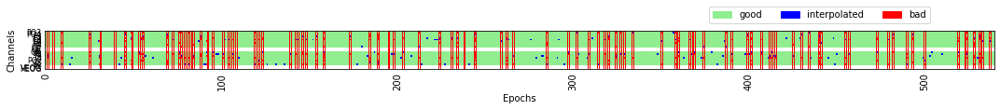

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[27_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -2.7837886033116632
[27_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -3.13206754710863
[27_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -2.105746764865754
[27_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -2.042393386741365
[27_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -2.7

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 28_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/28_DWR_bilateral_ss6.fdt
Reading 0 ... 1708543  =      0.000 ...  6834.172 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=4


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 21 epochs: 12, 19, 51, 52, 104, 115, 251, 280, 289, 294, 296, 304, 307, 329, 386, 389, 394, 423, 500, 519, 529


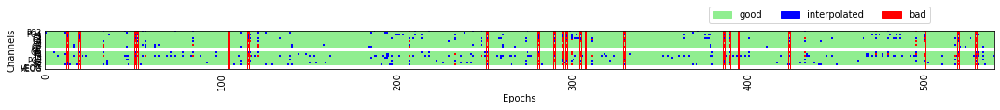

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[28_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -0.49105503769076364
[28_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: 0.18702508759004866
[28_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: 0.2906652990404311
[28_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: 0.06576399670887409
[28_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: 

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 29_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/29_DWR_bilateral_ss6.fdt
Reading 0 ... 1862527  =      0.000 ...  7450.108 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.80 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 3 epochs: 33, 97, 262


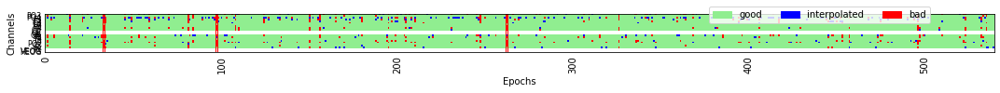

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[29_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 3.457231376434435
[29_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: 0.8380092864787166
[29_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -0.56622656408537
[29_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -0.0645507208890307
[29_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: 0.062

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 2_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/2_DWR_bilateral_ss6.fdt
Reading 0 ... 1853951  =      0.000 ...  7415.804 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124',

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=4


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 20 epochs: 3, 17, 20, 32, 73, 76, 104, 152, 225, 239, 306, 335, 339, 347, 354, 367, 414, 421, 473, 535


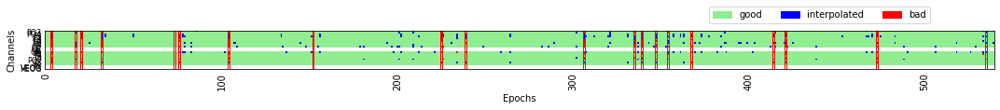

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[2_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -0.4552042556082153
[2_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -0.320241123432252
[2_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -1.5294268274624119
[2_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -1.7710764801332788
[2_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -1.757

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/539 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/539 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/539 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/539 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.20 and n_interpolate=1


  0%|          | Repairing epochs : 0/539 [00:00<?,       ?it/s]

Dropped 103 epochs: 18, 31, 34, 36, 57, 67, 74, 77, 81, 82, 84, 92, 98, 103, 117, 119, 121, 125, 132, 145, 148, 150, 153, 154, 157, 159, 162, 185, 186, 201, 214, 218, 220, 221, 225, 227, 228, 229, 232, 236, 251, 252, 253, 257, 262, 263, 265, 267, 274, 278, 291, 295, 308, 311, 317, 318, 324, 336, 337, 341, 345, 350, 352, 367, 381, 383, 385, 387, 388, 398, 399, 406, 407, 408, 409, 413, 420, 422, 426, 429, 433, 436, 441, 442, 448, 449, 460, 461, 468, 476, 485, 488, 493, 497, 501, 510, 514, 523, 524, 525, 532, 534, 536


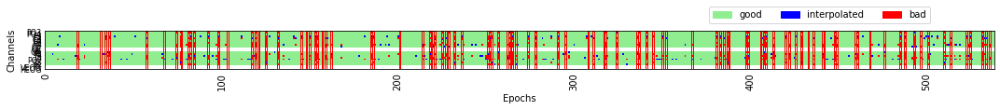

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[30_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 0.13371668646259385
[30_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -1.02676419551124
[30_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -1.5719992417376818
[30_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -0.7623621895013019
[30_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -1

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:226: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-CDA'.format(perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:227: RuntimeWarning: Mean of empty slice
  print('Perf: {}, Mean: {}'.format(perf, np.nanmean(cda_means)))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:237: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:238: RuntimeWarning: Mean of empty slice
  print

Processing: 31_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/31_DWR_bilateral_ss6.fdt
Reading 0 ... 1774975  =      0.000 ...  7099.900 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=4


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 11 epochs: 7, 13, 70, 149, 270, 276, 279, 294, 314, 431, 501


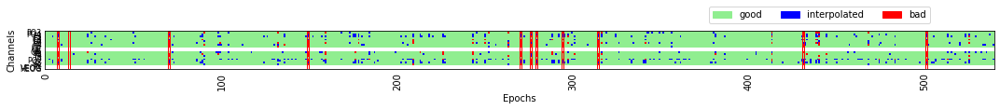

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[31_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 2.35790713206513
[31_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: 0.7438588986897913
[31_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: 0.2655206377924785
[31_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: 0.016437539196663412
[31_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -0.3

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 32_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/32_DWR_bilateral_ss6.fdt
Reading 0 ... 1970431  =      0.000 ...  7881.724 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 65 epochs: 4, 26, 30, 31, 33, 44, 46, 60, 62, 71, 72, 74, 83, 93, 95, 136, 147, 150, 192, 197, 200, 206, 210, 211, 221, 222, 225, 243, 245, 248, 273, 275, 276, 279, 280, 302, 303, 309, 314, 328, 329, 352, 358, 365, 370, 379, 383, 399, 401, 406, 407, 416, 428, 436, 440, 443, 454, 468, 486, 487, 502, 503, 526, 538, 539


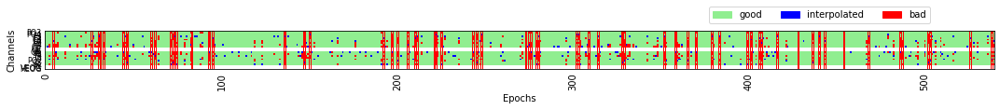

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[32_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 0.08844618049455878
[32_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: 1.0057250512401192
[32_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: 0.2326214684842189
[32_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: 0.9228361894070127
[32_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -0.

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 34_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/34_DWR_bilateral_ss6.fdt
Reading 0 ... 1725055  =      0.000 ...  6900.220 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 46 epochs: 11, 42, 59, 60, 75, 79, 86, 88, 94, 120, 129, 137, 153, 155, 183, 198, 214, 277, 280, 315, 316, 323, 326, 360, 367, 390, 393, 396, 402, 409, 418, 427, 435, 444, 451, 454, 459, 469, 482, 492, 497, 504, 508, 509, 528, 530


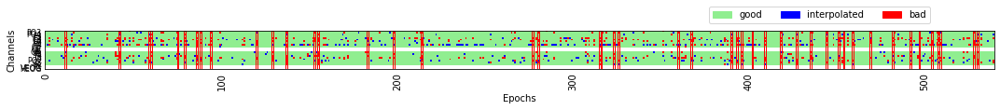

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[34_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 0.3281271009174255
[34_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -2.9240860118866814
[34_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -1.7700332892661348
[34_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -1.757379809229039
[34_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -2

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 25 epochs: 11, 30, 40, 98, 112, 129, 186, 234, 280, 290, 294, 339, 358, 428, 432, 442, 444, 457, 494, 498, 500, 502, 524, 529, 534


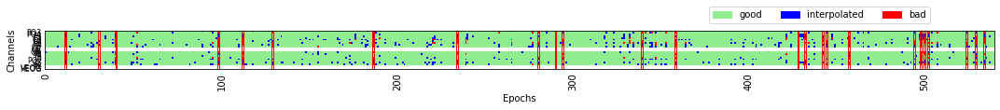

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[35_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -2.6481852743546046
[35_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -2.1366303428171154
[35_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -2.7529800613756263
[35_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -3.0245472256369954
[35_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: 

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:226: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-CDA'.format(perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:227: RuntimeWarning: Mean of empty slice
  print('Perf: {}, Mean: {}'.format(perf, np.nanmean(cda_means)))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:237: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:238: RuntimeWarning: Mean of empty slice
  print

Processing: 36_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/36_DWR_bilateral_ss6.fdt
Reading 0 ... 2116351  =      0.000 ...  8465.404 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.70 and n_interpolate=4


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 7 epochs: 26, 139, 265, 317, 362, 401, 498


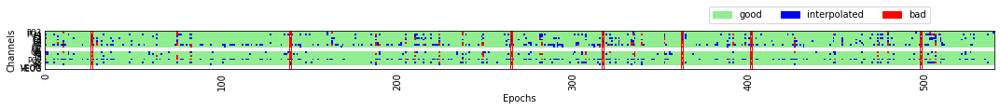

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[36_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 0.9206834871422644
[36_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: 0.6835887018004166
[36_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -0.16950478720615794
[36_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: 0.47859175766658235
[36_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 38 epochs: 2, 16, 25, 29, 60, 61, 63, 81, 83, 110, 111, 128, 130, 143, 232, 234, 247, 263, 271, 272, 273, 284, 327, 329, 336, 361, 365, 378, 401, 411, 428, 430, 433, 498, 504, 506, 511, 531


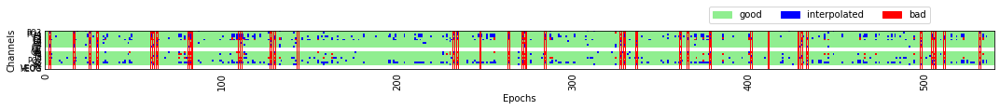

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[37_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -4.5648171407742195
[37_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -5.278576102933056
[37_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -4.130075197058585
[37_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -4.575945477361177
[37_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -4.

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/431 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/431 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/431 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/431 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.90 and n_interpolate=1


  0%|          | Repairing epochs : 0/431 [00:00<?,       ?it/s]

Dropped 1 epoch: 20


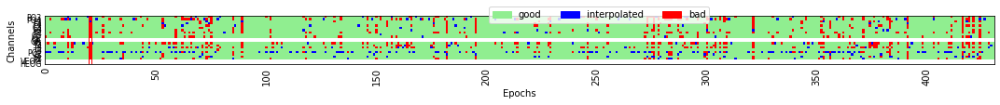

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[18_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -1.2290304181518703
[18_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -3.3962689927412804
[18_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -1.2496089030019177
[18_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -1.4856510962547602
[18_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: 

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/420 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/420 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/420 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/420 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=4


  0%|          | Repairing epochs : 0/420 [00:00<?,       ?it/s]

Dropped 79 epochs: 0, 7, 11, 32, 33, 34, 36, 39, 40, 73, 74, 75, 77, 78, 79, 81, 92, 95, 97, 98, 101, 105, 106, 108, 116, 119, 120, 122, 127, 140, 147, 152, 160, 161, 168, 172, 175, 176, 180, 205, 206, 209, 211, 212, 217, 233, 235, 237, 238, 243, 246, 249, 250, 251, 253, 259, 286, 288, 289, 290, 294, 305, 307, 314, 319, 321, 323, 326, 327, 328, 337, 352, 378, 386, 387, 408, 413, 414, 415


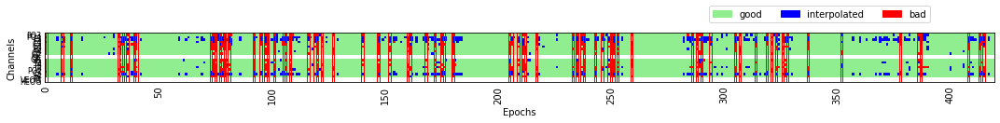

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[33_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 0.8472983057667782
[33_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -3.86324196167066
[33_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -1.214146882136986
[33_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -1.9982863039005
[33_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -0.8236

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:84: RuntimeWarning: evoked object is empty (based on less than 1 epoch)
  evoked_right = epochs_right.average()
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:85: RuntimeWarning: evoked object is empty (based on less than 1 epoch)
  evoked_left = epochs_left.average()
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of

Processing: 4_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/4_DWR_bilateral_ss6.fdt
Reading 0 ... 1370111  =      0.000 ...  5480.444 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124',

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.90 and n_interpolate=4


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 2 epochs: 458, 516


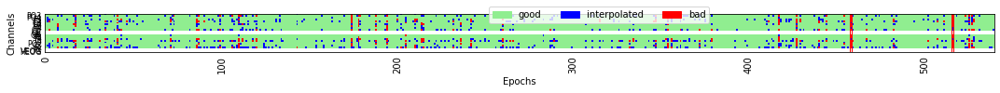

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[4_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 0.39852512492487885
[4_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -2.4291421075078987
[4_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -2.136415190991914
[4_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -2.26798353442604
[4_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -0.81775

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:226: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-CDA'.format(perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:227: RuntimeWarning: Mean of empty slice
  print('Perf: {}, Mean: {}'.format(perf, np.nanmean(cda_means)))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:237: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:238: RuntimeWarning: Mean of empty slice
  print

Processing: 38_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/38_DWR_bilateral_ss6.fdt
Reading 0 ... 1642239  =      0.000 ...  6568.956 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/539 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/539 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/539 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/539 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=1.00 and n_interpolate=17


  0%|          | Repairing epochs : 0/539 [00:00<?,       ?it/s]

No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.


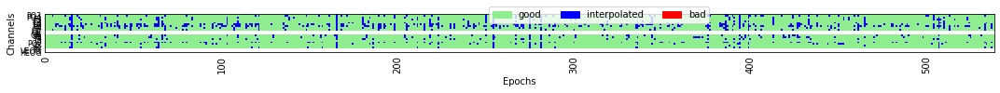

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[38_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -2.1256520058976687
[38_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -1.8660062844958285
[38_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -2.330315638300995
[38_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -2.7619699313210213
[38_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 39_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/39_DWR_bilateral_ss6.fdt
Reading 0 ... 1934975  =      0.000 ...  7739.900 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.70 and n_interpolate=4


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.


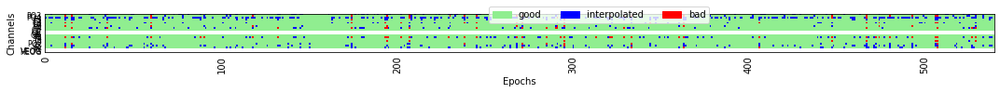

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[39_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 4.126738774632506
[39_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: 1.2537374775682057
[39_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -0.05054649851940196
[39_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -0.29506559173064856
[39_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: 0

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:226: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-CDA'.format(perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:227: RuntimeWarning: Mean of empty slice
  print('Perf: {}, Mean: {}'.format(perf, np.nanmean(cda_means)))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:237: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:238: RuntimeWarning: Mean of empty slice
  print

Processing: 3_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/3_DWR_bilateral_ss6.fdt
Reading 0 ... 1765247  =      0.000 ...  7060.988 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124',

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.90 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.


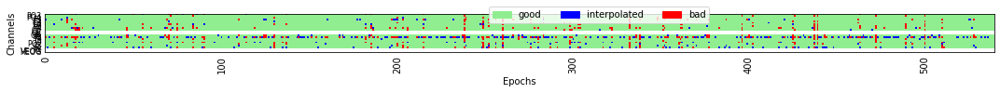

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[3_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 3.9829543865239376
[3_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: 1.0761150099448413
[3_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -2.4538804109623515
[3_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -2.5479187742287346
[3_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -2.3475

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 40_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/40_DWR_bilateral_ss6.fdt
Reading 0 ... 1577343  =      0.000 ...  6309.372 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 16 epochs: 44, 62, 63, 77, 86, 110, 122, 124, 234, 280, 317, 318, 389, 400, 462, 525


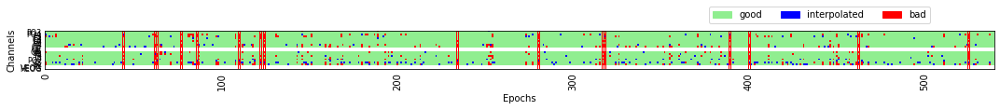

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[40_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -4.406388667654805
[40_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -6.246462583469209
[40_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -5.0295012221788955
[40_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -5.979160731248053
[40_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -6.

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=1.00 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 4 epochs: 75, 87, 258, 386


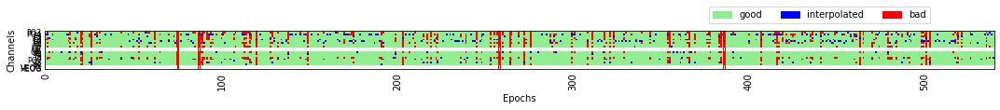

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[41_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -0.05726605315345627
[41_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -3.5984518246355823
[41_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -3.5835352728200385
[41_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -2.9865354701975493
[41_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4:

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.60 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 29 epochs: 26, 38, 53, 66, 87, 121, 135, 165, 169, 171, 181, 203, 217, 238, 274, 285, 305, 308, 311, 338, 343, 345, 385, 398, 458, 498, 500, 505, 509


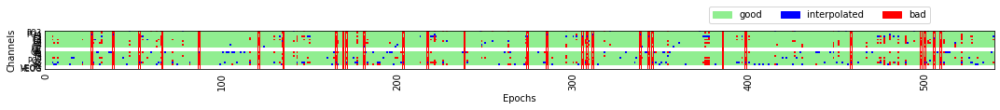

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[42_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -0.7135738934016249
[42_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -1.8187558869136309
[42_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -1.8668828072237194
[42_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -2.3863234457260596
[42_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: 

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/91 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/91 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/91 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/91 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=4


  0%|          | Repairing epochs : 0/91 [00:00<?,       ?it/s]

Dropped 16 epochs: 1, 3, 5, 10, 16, 23, 27, 35, 44, 49, 52, 63, 73, 78, 86, 90


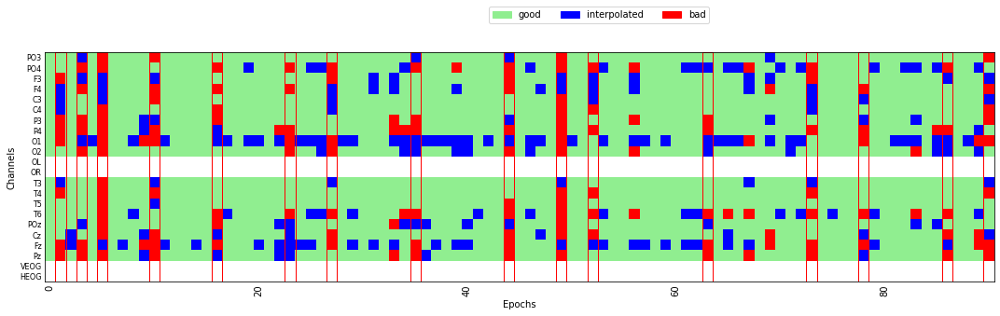

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[43_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -4.449753420858642
[43_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -1.3530281184055268
[43_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -2.5804691993579443
[43_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -1.1068110908286244
[43_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:84: RuntimeWarning: evoked object is empty (based on less than 1 epoch)
  evoked_right = epochs_right.average()
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:85: RuntimeWarning: evoked object is empty (based on less than 1 epoch)
  evoked_left = epochs_left.average()
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:226: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-CDA'.format(perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:227: RuntimeWarning: Mean of empty slice
  print('Perf: {}, Mean: {}'.format(perf, np.nanmean(cda_means)))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(repor

Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/44_DWR_bilateral_ss6.fdt
Reading 0 ... 2088191  =      0.000 ...  8352.764 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '1

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/450 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/450 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/450 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/450 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/450 [00:00<?,       ?it/s]

Dropped 13 epochs: 16, 41, 110, 128, 135, 136, 187, 215, 263, 273, 324, 397, 404


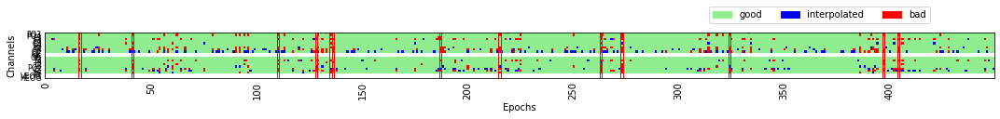

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[44_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -2.6075728268295997
[44_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -2.9408259618160533
[44_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -3.2208732798531114
[44_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -3.115609472576031
[44_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:226: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-CDA'.format(perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:227: RuntimeWarning: Mean of empty slice
  print('Perf: {}, Mean: {}'.format(perf, np.nanmean(cda_means)))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:237: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:238: RuntimeWarning: Mean of empty slice
  print

Processing: 45_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/45_DWR_bilateral_ss6.fdt
Reading 0 ... 1692927  =      0.000 ...  6771.708 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=4


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 68 epochs: 1, 3, 13, 21, 24, 25, 33, 36, 42, 51, 52, 55, 58, 76, 99, 111, 126, 142, 143, 149, 154, 160, 161, 162, 165, 197, 200, 205, 208, 212, 216, 217, 218, 219, 224, 231, 239, 268, 273, 293, 296, 314, 315, 338, 347, 350, 362, 383, 386, 393, 396, 418, 429, 437, 444, 459, 462, 466, 470, 471, 476, 494, 504, 505, 511, 520, 522, 526


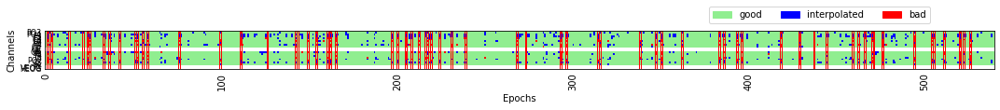

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[45_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -5.7022484867876395
[45_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -4.308142170793727
[45_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -6.919473610571051
[45_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -6.171923001962466
[45_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -5.

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:226: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-CDA'.format(perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:227: RuntimeWarning: Mean of empty slice
  print('Perf: {}, Mean: {}'.format(perf, np.nanmean(cda_means)))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:237: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:238: RuntimeWarning: Mean of empty slice
  print

Processing: 46_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/46_DWR_bilateral_ss6.fdt
Reading 0 ... 1780735  =      0.000 ...  7122.940 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=4


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 56 epochs: 0, 1, 5, 9, 10, 11, 14, 15, 23, 33, 47, 48, 56, 58, 78, 79, 82, 108, 126, 171, 177, 187, 224, 269, 272, 273, 276, 279, 280, 282, 284, 286, 287, 288, 289, 293, 314, 315, 319, 328, 332, 335, 338, 378, 402, 404, 408, 415, 416, 428, 430, 434, 462, 494, 496, 509


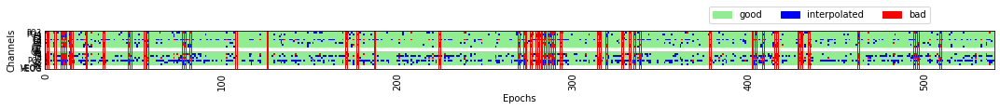

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[46_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -0.5879088989169656
[46_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -1.5018271268573318
[46_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -1.8354182583989627
[46_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -2.20923327139384
[46_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -2

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 47_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/47_DWR_bilateral_ss6.fdt
Reading 0 ... 2113663  =      0.000 ...  8454.652 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.70 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 10 epochs: 9, 163, 173, 205, 229, 246, 268, 301, 330, 378


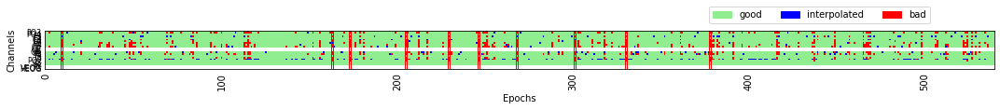

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[47_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -2.6343159417336133
[47_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -1.9149945354766031
[47_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -2.5198646876601187
[47_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -2.681242288900398
[47_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=4


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 84 epochs: 2, 7, 10, 12, 20, 31, 34, 38, 45, 53, 67, 68, 70, 72, 94, 96, 101, 104, 106, 117, 120, 122, 126, 127, 133, 148, 152, 162, 173, 188, 190, 193, 195, 198, 199, 204, 205, 209, 217, 222, 223, 227, 232, 233, 245, 257, 268, 290, 303, 304, 305, 318, 328, 334, 337, 375, 377, 382, 388, 389, 392, 393, 394, 396, 401, 402, 406, 424, 433, 447, 468, 474, 478, 487, 494, 500, 506, 510, 514, 515, 521, 523, 533, 534


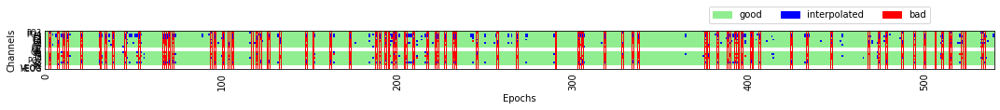

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[48_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -2.2478314967711515
[48_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -3.595293582792288
[48_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -2.7504502939905584
[48_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -3.010240663918411
[48_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -2

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.50 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 7 epochs: 29, 253, 272, 307, 331, 383, 420


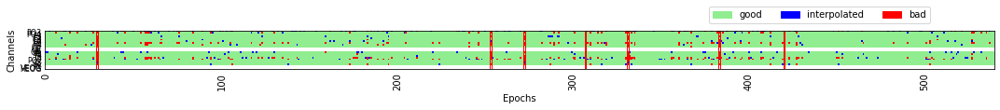

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[5_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -1.3355846251071555
[5_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -1.243863965209619
[5_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -0.6318261792874167
[5_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -0.14186545337522113
[5_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -1.22

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


Processing: 6_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/6_DWR_bilateral_ss6.fdt
Reading 0 ... 1903487  =      0.000 ...  7613.948 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124',

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/450 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/450 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/450 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/450 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=4


  0%|          | Repairing epochs : 0/450 [00:00<?,       ?it/s]

Dropped 22 epochs: 6, 16, 35, 42, 63, 66, 93, 101, 117, 132, 185, 221, 236, 240, 264, 265, 302, 340, 346, 362, 370, 449


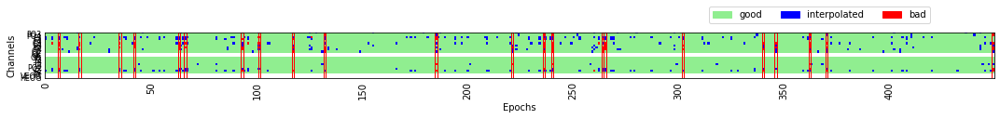

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[6_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -0.7092038436557194
[6_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -0.7902092150170101
[6_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -0.5158345706110812
[6_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: 0.7582542437127122
[6_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -2.642

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:226: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-CDA'.format(perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:227: RuntimeWarning: Mean of empty slice
  print('Perf: {}, Mean: {}'.format(perf, np.nanmean(cda_means)))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:237: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:238: RuntimeWarning: Mean of empty slice
  print

Processing: 7_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/7_DWR_bilateral_ss6.fdt
Reading 0 ... 1561983  =      0.000 ...  6247.932 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124',

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/538 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/538 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/538 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/538 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


  0%|          | Repairing epochs : 0/538 [00:00<?,       ?it/s]

Dropped 23 epochs: 43, 76, 80, 174, 224, 228, 244, 283, 287, 288, 290, 321, 357, 358, 366, 417, 421, 452, 483, 497, 500, 514, 533


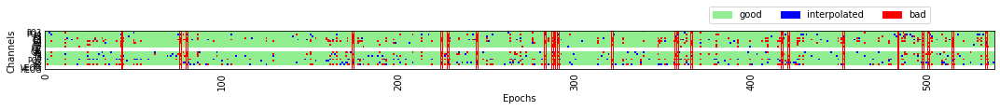

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[7_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: 0.9309414059947579
[7_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -0.25602319977098353
[7_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -1.4635873927344156
[7_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -1.0930943846599863
[7_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -1.23

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/mne/bem.py:967: RuntimeWarning: Mean of empty slice.
  radius_init = radii.mean()
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/nick/opt/miniconda3/envs/clct/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 84 epochs: 1, 3, 5, 9, 16, 18, 34, 52, 54, 57, 70, 92, 98, 100, 105, 120, 121, 128, 132, 134, 137, 139, 142, 151, 164, 169, 181, 190, 193, 194, 196, 197, 200, 203, 204, 207, 226, 228, 243, 247, 249, 251, 256, 257, 260, 272, 300, 303, 307, 315, 338, 344, 355, 356, 372, 375, 377, 379, 395, 397, 418, 427, 430, 432, 434, 443, 445, 449, 451, 458, 459, 464, 465, 473, 478, 487, 492, 499, 505, 506, 516, 517, 524, 538


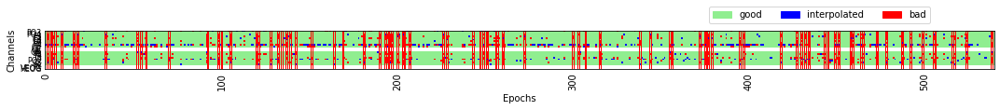

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[8_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -3.9875495812149047
[8_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -1.7002978649106748
[8_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -1.9634271442699718
[8_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -2.5511132210523084
[8_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -1.98

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:226: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-CDA'.format(perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:227: RuntimeWarning: Mean of empty slice
  print('Perf: {}, Mean: {}'.format(perf, np.nanmean(cda_means)))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:237: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(cond, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:238: RuntimeWarning: Mean of empty slice
  print

Processing: 9_DWR_bilateral_ss6.set...
Reading /Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/9_DWR_bilateral_ss6.fdt
Reading 0 ... 1856639  =      0.000 ...  7426.556 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 sec)

Used Annotations descriptions: ['101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124',

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:40: RuntimeWarning: The events passed to the Epochs constructor are not chronologically ordered.
  all_epochs = Epochs(eeg, all_events, tmin=epoch_tmin, tmax=epoch_length, baseline=baseline_corr, preload=True, event_repeated='merge')


  0%|          | Creating augmented epochs : 0/18 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/18 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.70 and n_interpolate=1


  0%|          | Repairing epochs : 0/540 [00:00<?,       ?it/s]

Dropped 5 epochs: 185, 237, 457, 519, 534


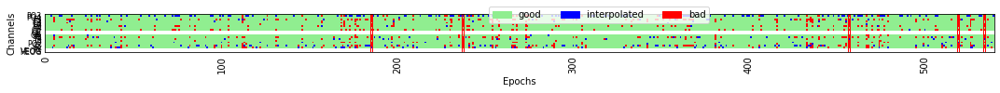

---------- 6-left-acc_0 -------------
---------- 6-left-acc_1 -------------
---------- 6-left-acc_2 -------------
---------- 6-left-acc_3 -------------
---------- 6-left-acc_4 -------------
---------- 6-left-acc_5 -------------
---------- 6-left-acc_6 -------------
---------- 6-right-acc_0 -------------
---------- 6-right-acc_1 -------------
---------- 6-right-acc_2 -------------
---------- 6-right-acc_3 -------------
---------- 6-right-acc_4 -------------
---------- 6-right-acc_5 -------------
---------- 6-right-acc_6 -------------
====================== /EPOCHING ======================
[9_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_0: -5.047004222106982
[9_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_1: -7.130742350103231
[9_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_2: -7.777750415895083
[9_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_3: -8.408373691637326
[9_DWR_bilateral_ss6.set] Adding Mean CDA Amp for 6-left-acc_4: -10.64282

/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:224: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:235: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:246: RuntimeWarning: Mean of empty slice
  cda_means.append(np.nanmean(report.at[filename, '{}-{}-{}-CDA'.format(cond,side,perf)]))
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:248: RuntimeWarning: Mean of empty slice
  report.at[filename,'{}-{}-CDA'.format(side, perf)] = np.nanmean(cda_means)
/Users/nick/Documents/PhD/CLCT/reprod/studies/cda_utils.py:249: RuntimeWarning: Mean of empty slice
  print('Side: {} | Perf: {}, Mean: {}'.format(side, perf, np.nanmean(cda_means)))


48 Subjects & 48290 Trials


,6,left,right,acc_0,acc_1,acc_2,acc_3,acc_4,acc_5,acc_6,...,right-acc_6-CDA,checksum,notes,acc_0-CDA,acc_1-CDA,acc_2-CDA,acc_3-CDA,acc_4-CDA,acc_5-CDA,acc_6-CDA
10_DWR_bilateral_ss6.set,510,255,255,16,75,182,173,54,9,1,...,0.466643,0,,1.025148,-0.763694,-0.498129,-0.507355,-0.837445,-0.668845,0.466643
11_DWR_bilateral_ss6.set,540,270,270,21,68,166,191,71,22,1,...,1.73633,0,0,-0.678373,-1.510228,-1.374247,-1.472918,-1.565950,-1.016447,1.73633
12_DWR_bilateral_ss6.set,540,270,270,5,19,66,174,187,75,14,...,2.431306,0,0,1.011949,-0.845214,-0.480155,-0.364458,-0.521414,-0.993204,0.584814
13_DWR_bilateral_ss6.set,540,270,270,54,125,205,113,38,5,0,...,NaN,0,0,0.338806,-0.453027,-0.279442,0.201589,-1.266568,-0.733104,NaN
14_DWR_bilateral_ss6.set,540,270,270,10,47,118,221,111,30,3,...,-3.015029,0,0,0.979395,-0.811400,-0.517802,-0.651738,-1.089782,-1.253810,-3.015029
15_DWR_bilateral_ss6.set,540,270,270,19,41,163,193,104,16,4,...,-0.212065,0,0,-1.353929,-1.811380,-0.990886,-1.407460,-1.696180,-2.410801,-1.057705
16_DWR_bilateral_ss6.set,451,225,226,17,83,159,118,61,11,2,...,NaN,0,0,-0.276208,-1.242314,-0.312558,-1.149106,-0.972335,-3.466022,1.647905
17_DWR_bilateral_ss6.set,540,270,270,41,144,158,126,53,15,3,...,6.533922,0,0,-0.743418,-0.385348,-0.632353,-0.816146,-1.704428,-3.479072,-0.353606
19_DWR_bilateral_ss6.set,105,52,53,16,43,29,13,4,0,0,...,NaN,0,0,-0.948262,-0.867974,-0.805415,-0.105310,-3.786775,NaN,NaN
1_DWR_bilateral_ss6.set,540,270,270,7,30,132,200,131,36,4,...,-5.586061,0,0,-0.625919,-2.588681,-1.940009,-2.462520,-1.615875,-0.397515,-5.352564


In [3]:
#==================================================================
# General Variables
#==================================================================
study_id = 'Adam2018-Exp2'

# Organize Triggers
triggers = dict();

# --------------------------
# Fuck-up with events when loading in Python. I don't know why... NEED TO CONVERT.
triggers['6'] = [36, 46]

triggers['left'] = [36]
triggers['right'] = [46]

triggers['good'] = [81,82,83,84,85,86]
triggers['bad'] = [80]

triggers['acc_0'] = [80]
triggers['acc_1'] = [81]
triggers['acc_2'] = [82]
triggers['acc_3'] = [83]
triggers['acc_4'] = [84]
triggers['acc_5'] = [85]
triggers['acc_6'] = [86]
    
# Labels
conds = ['6']
sides = ['left', 'right']
perfs = ['good', 'bad'] # Here it is slightly different! (because of granular accuracies!)
accs =  ['acc_0', 'acc_1', 'acc_2', 'acc_3', 'acc_4', 'acc_5', 'acc_6']

# Internal Triggers to Epochs Properly
internal_triggers = dict()
internal_triggers_count = 0
for cond in conds:
    for side in sides:
        for perf in accs: #perfs:
            internal_triggers_count = internal_triggers_count + 1
            internal_triggers['{}-{}-{}'.format(cond,side,perf)] = internal_triggers_count
            
# CDA Channels
chan_right = ['O2', 'P4', 'PO4', 'T6'] # Not using: 'OR' because of cleaning... (no position set for OR)
chan_left =  ['O1', 'P3', 'PO3', 'T5'] # Not using: 'OL' because of cleaning... (no position set for OL)

# Channels
chanLabels = {'EEG 000':'PO3', 'EEG 001':'PO4', 'EEG 002':'F3', 'EEG 003':'F4', 'EEG 004':'C3', 'EEG 005':'C4', 'EEG 006':'P3', 'EEG 007':'P4', 'EEG 008':'O1', 'EEG 009':'O2', 'EEG 010':'OL', 'EEG 011':'OR', 'EEG 012':'T3', 'EEG 013':'T4', 'EEG 014':'T5', 'EEG 015':'T6', 'EEG 016':'POz', 'EEG 017':'Cz', 'EEG 018':'Fz', 'EEG 019':'Pz', 'EEG 020':'VEOG', 'EEG 021':'HEOG'}

# Epoc Information
epoch_length = 1.5  #1.65
epoch_tmin = -0.2
baseline_corr = (-0.2, 0)

# CDA info
cda_window = (0.4, 1.5)

# CDA main variable!
cda_dict_all = dict()
epochs_dict_all = dict()
perf_report_all = dict()
report = prep_report(conds, sides, accs) #perfs)

times = None

#==================================================================
# Main Loop - Loading All Files & Extract CDAs.
#==================================================================
directory_path = '/Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/Raw EEG Files (.rdf)/YR EEGLab Files/'

eegfiles = [os.path.join(dirpath, f)
    for dirpath, dirnames, files in os.walk(directory_path)
    for f in files if f.endswith('.set')]

#filepath = directory_path + '1_DWR_Bilateral.set'
for filepath in eegfiles:
    filename = filepath[filepath.rfind('/')+1:]
    print('Processing: ' + filename + '...')

    # ------------------------
    # 1. -- Load File --
    # ------------------------
    raw = read_raw_eeglab(filepath, preload=True)

    # ------------------------
    # 2. -- Preprocessing --
    # ------------------------
    # Set Electrodes Locations - Used Brain Products (locations seem to in eeg file...)
    raw.rename_channels(chanLabels);
    raw.set_channel_types({'VEOG':'eog', 'HEOG':'eog', 'OR':'misc', 'OL':'misc'})
    montage = mne.channels.make_standard_montage('standard_1020')
    raw.set_montage(montage, on_missing='warn')

    preproc = raw

    # Filter
    preproc = preproc.filter(.1, 20., fir_design='firwin', skip_by_annotation='edge')

    # Events
    events = mne.events_from_annotations(preproc)

    # Select Channels (to save time on cleaning)
    #preproc = preproc.pick_channels(chan_right + chan_left)

    # Plot (visual check)
    #preproc.plot(events=events, block=True, lowpass=40)

    # ------------------------
    # 3. -- Epochs --
    # ------------------------
    new_triggers = copy.deepcopy(triggers)
    new_triggers = convert_triggers(events, conds, sides, perfs, accs, new_triggers)

    specific_events = get_specific_events(events[0], conds, sides, perfs, accs, new_triggers, internal_triggers)

    epochs_dict = get_epochs(preproc, specific_events, epoch_length, epoch_tmin, baseline_corr, clean=True)

    epochs_dict_all[filename] = epochs_dict

    # times, used for CDA mean amp report.
    if times is None: times = epochs_dict[conds[0]][sides[0]][accs[0]].times 

    # ------------------------
    # 4. -- CDA --
    # ------------------------
    cda_dict_all[filename] = get_CDA(epochs_dict, conds, sides, accs, chan_right, chan_left)

    # ------------------------
    # 6. - Report & Checksum -
    # ------------------------
    report = fill_report(report, filename, specific_events)
    report = add_cda_report(report, filename, conds, sides, accs, cda_dict_all[filename], times, cda_window=cda_window)
    report.at[filename, 'checksum'] = checksum(specific_events, epochs_dict)

    perf_report_all[filename] = get_CDA_perf_report(epochs_dict, conds, sides, accs, chan_right, chan_left, cda_window=cda_window)

# Print report
print('{} Subjects & {} Trials'.format(len(report), 2*np.sum([report[cond].sum() for cond in conds])))
report

## 2. Plot Grand CDA Average

==== SKIPPED: 0 points! (File: 29_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_0)
==== SKIPPED: 0 points! (File: 3_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_0)
==== SKIPPED: 0 points! (File: 19_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_4)
==== SKIPPED: 0 points! (File: 19_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_5)
==== SKIPPED: 0 points! (File: 35_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_5)
==== SKIPPED: 0 points! (File: 43_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_5)
==== SKIPPED: 0 points! (File: 6_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_5)
==== SKIPPED: 0 points! (File: 10_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_6)
==== SKIPPED: 0 points! (File: 11_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_6)
==== SKIPPED: 0 points! (File: 13_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_6)
==== SKIPPED: 0 points! (File: 14_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_6)
==== SKIPPED: 0 points! (File: 16_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_6)
==== SKIPPED: 0 points! (File: 19_DWR_bila

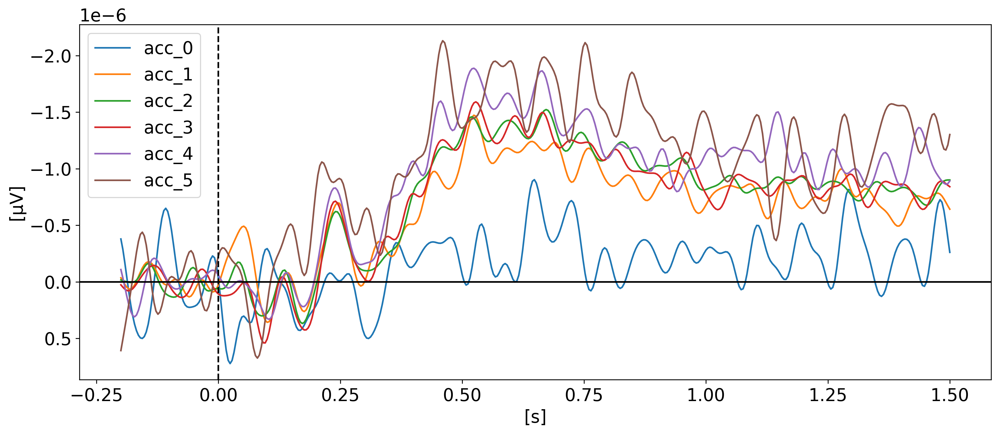

In [17]:
cda_all = dict()

for cond in cda_dict_all[list(cda_dict_all.keys())[0]].keys():
    cda_all[cond] = dict()
    for perf in accs:
        cda_all[cond][perf] = np.array([])
        for f in cda_dict_all.keys():
            ldict = cda_dict_all[f][cond]['left']
            rdict = cda_dict_all[f][cond]['right']
            if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):
                cda_dict_cur = (cda_dict_all[f][cond]['left'][perf] + cda_dict_all[f][cond]['right'][perf])/2
                cda_all[cond][perf] = np.vstack([cda_all[cond][perf], cda_dict_cur]) if len(cda_all[cond][perf]) else cda_dict_cur
            else:
                print("==== SKIPPED: 0 points! (File: {} - Cond: {} - Acc: {})".format(str(f), str(cond), str(perf)))

# Plot
plt.rcParams.update({'font.size': 16})

plt.figure(figsize=(15, 6), dpi=300)
for acc in accs:
    if acc != 'acc_6':
        plt.plot(times, np.nanmean(cda_all['6'][acc], 0), label=acc)
plt.axvline(x=0, color='k', linestyle='--')
plt.axhline(y=0, color='k', linestyle='-')
plt.gca().invert_yaxis()
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[s]')

plt.savefig("./{}-reprod.png".format(study_id), dpi=300, format='png')

==== SKIPPED: 0 points! (File: 19_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_4)
==== SKIPPED: 0 points! (File: 19_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_5)
==== SKIPPED: 0 points! (File: 35_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_5)
==== SKIPPED: 0 points! (File: 43_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_5)
==== SKIPPED: 0 points! (File: 6_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_5)
==== SKIPPED: 0 points! (File: 10_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_6)
==== SKIPPED: 0 points! (File: 11_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_6)
==== SKIPPED: 0 points! (File: 13_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_6)
==== SKIPPED: 0 points! (File: 14_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_6)
==== SKIPPED: 0 points! (File: 16_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_6)
==== SKIPPED: 0 points! (File: 19_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_6)
==== SKIPPED: 0 points! (File: 23_DWR_bilateral_ss6.set - Cond: 6 - Acc: acc_6)
==== SKIPPED: 0 points! (File: 24_DWR_bil

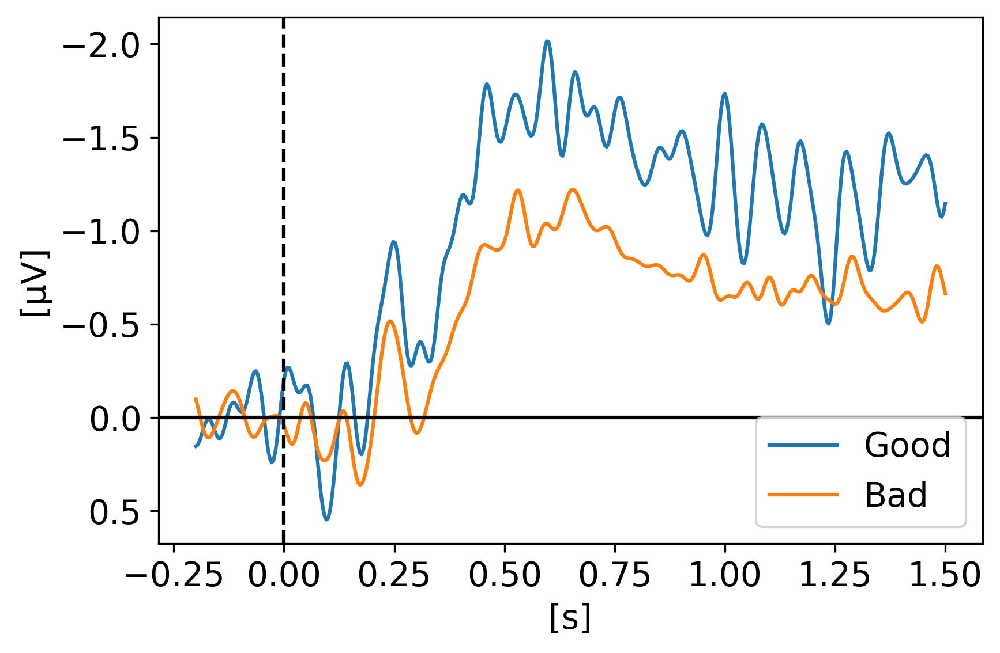

In [5]:
cda_all_good = dict()
for cond in cda_dict_all[list(cda_dict_all.keys())[0]].keys():
    cda_all_good[cond] = np.array([])
    for perf in ['acc_4','acc_5','acc_6']:
        for f in cda_dict_all.keys():
            ldict = cda_dict_all[f][cond]['left']
            rdict = cda_dict_all[f][cond]['right']
            if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):
                cda_dict_cur = (cda_dict_all[f][cond]['left'][perf] + cda_dict_all[f][cond]['right'][perf])/2
                cda_all_good[cond] = np.vstack([cda_all_good[cond], cda_dict_cur]) if len(cda_all_good[cond]) else cda_dict_cur
            else:
                print("==== SKIPPED: 0 points! (File: {} - Cond: {} - Acc: {})".format(str(f), str(cond), str(perf)))

                
cda_all_bad = dict()
for cond in cda_dict_all[list(cda_dict_all.keys())[0]].keys():
    cda_all_bad[cond] = np.array([])
    for perf in ['acc_0','acc_1','acc_2','acc_3']:
        for f in cda_dict_all.keys():
            ldict = cda_dict_all[f][cond]['left']
            rdict = cda_dict_all[f][cond]['right']
            if (perf in ldict.keys() and len(ldict[perf])) and (perf in rdict.keys() and len(rdict[perf])):
                cda_dict_cur = (cda_dict_all[f][cond]['left'][perf] + cda_dict_all[f][cond]['right'][perf])/2
                cda_all_bad[cond] = np.vstack([cda_all_bad[cond], cda_dict_cur]) if len(cda_all_bad[cond]) else cda_dict_cur
            else:
                print("==== SKIPPED: 0 points! (File: {} - Cond: {} - Acc: {})".format(str(f), str(cond), str(perf)))

                
# Plot
plt.rcParams.update({'font.size': 14})

fig = plt.figure(figsize=(6, 4), dpi=300)
plt.plot(times, np.nanmean(cda_all_good['6'], 0) * 1e6, label='Good')
plt.plot(times, np.nanmean(cda_all_bad['6'], 0) * 1e6, label='Bad')
plt.axvline(x=0, color='k', linestyle='--')
plt.axhline(y=0, color='k', linestyle='-')
plt.gca().invert_yaxis()
plt.legend()
plt.ylabel('[μV]')
plt.xlabel('[s]')

plt.tight_layout()
fig.savefig("./{}-reprod.png".format(study_id), dpi=300, format='png')

## Save CDA Data

In [23]:
data_pickle = dict()
data_pickle['times'] = times
data_pickle['CDA'] = cda_dict_all
data_pickle['epochs'] = epochs_dict_all
data_pickle['report'] = report
data_pickle['report_perf'] = perf_report_all

with open("{}_clean-20hz.pkl".format(study_id),"wb") as f:
    pickle.dump(data_pickle, f)

## Load CDA Data

In [2]:
with open("{}_clean-20hz.pkl".format(study_id),"rb") as f:
    data_pickle = pickle.load(f)
    
times = data_pickle['times']
cda_dict_all = data_pickle['CDA']
epochs_dict_all = data_pickle['epochs']
report = data_pickle['report']
perf_report_all = data_pickle['report_perf']

len(cda_dict_all)

48

## Analysis - Show Spread per subject

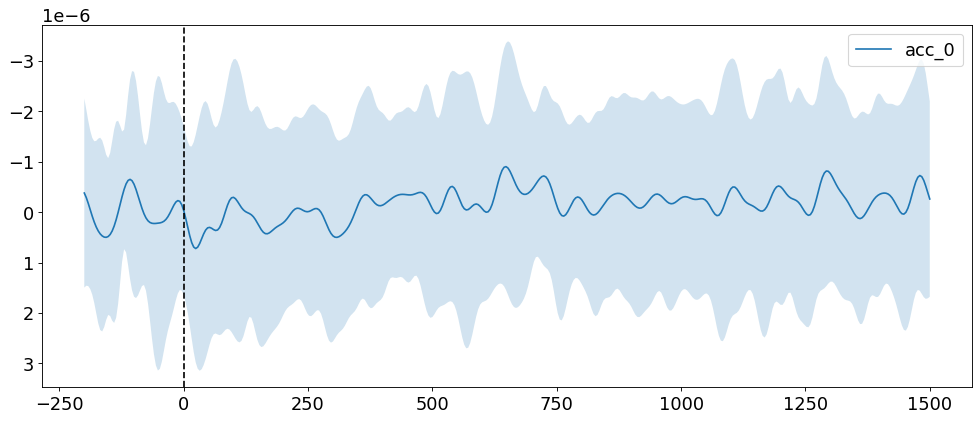

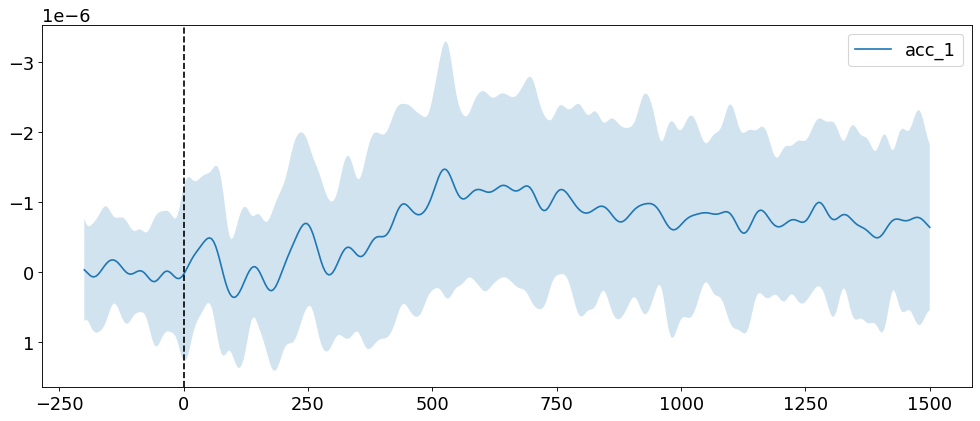

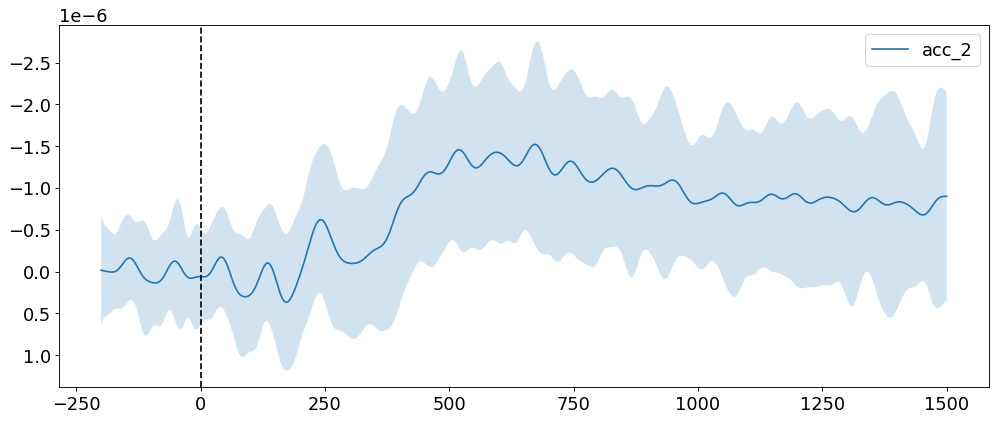

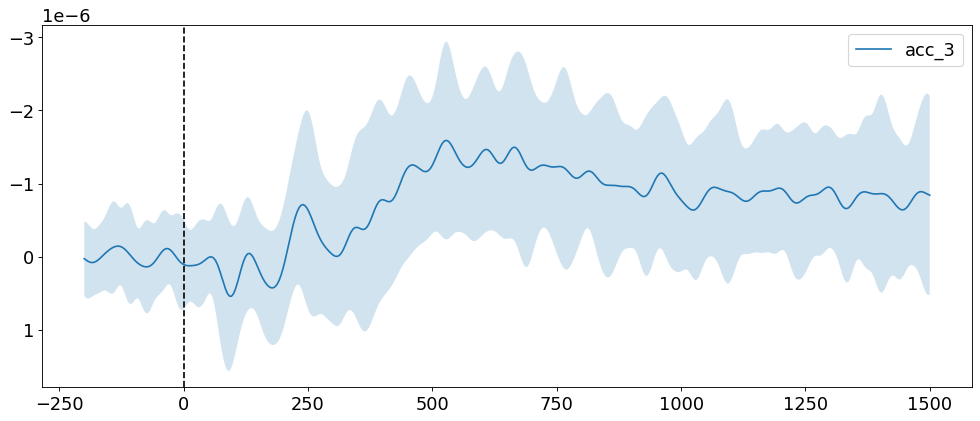

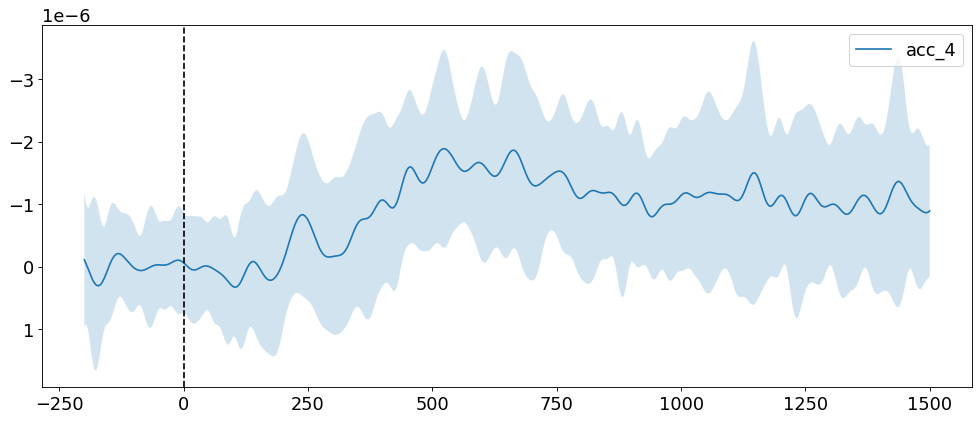

...

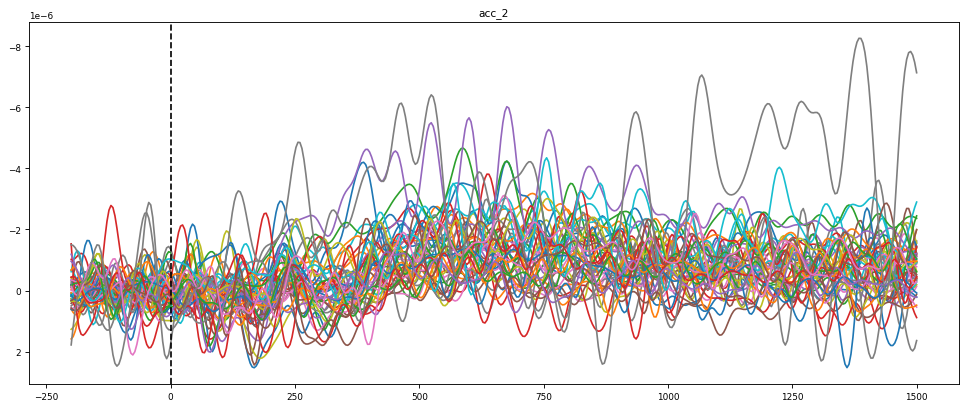

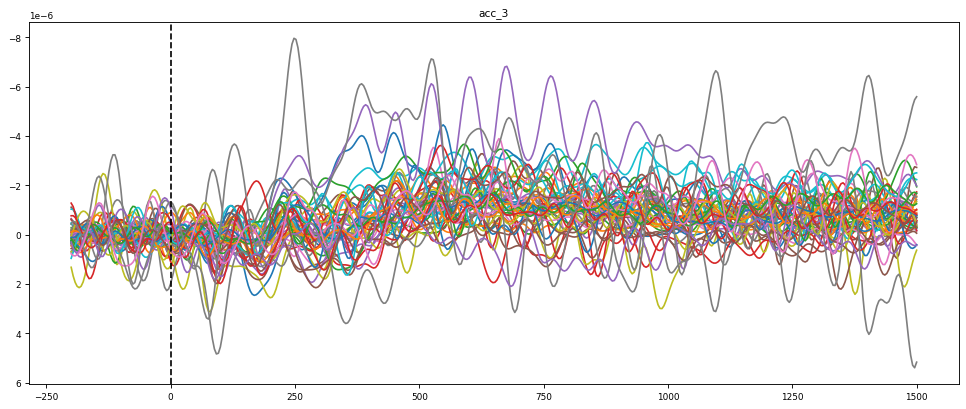

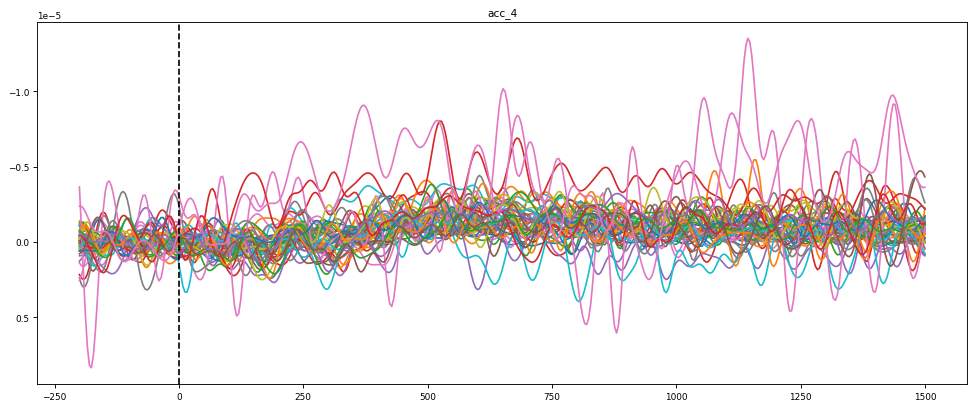

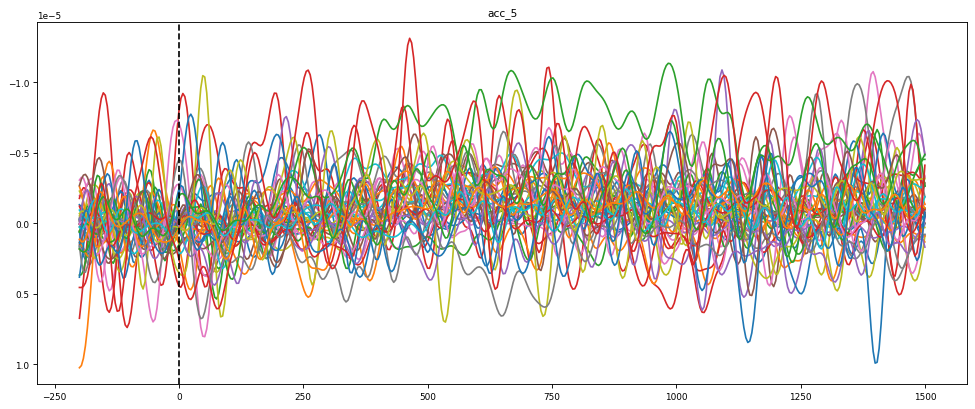

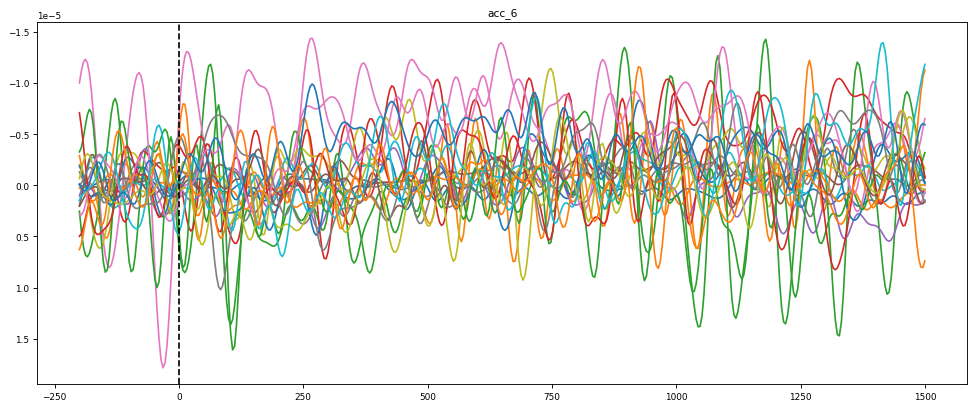

/var/folders/gn/5c249d_15xb7y6sdl7n8cn9m0000gn/T/ipykernel_12423/2598183903.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, len(new_accs), figsize=(15,6))


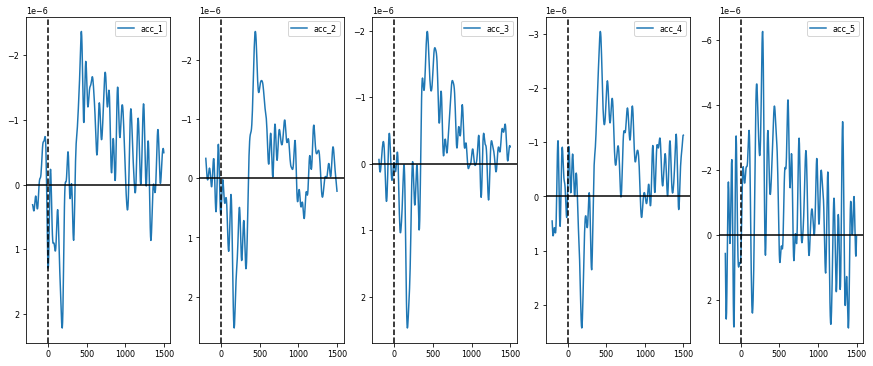

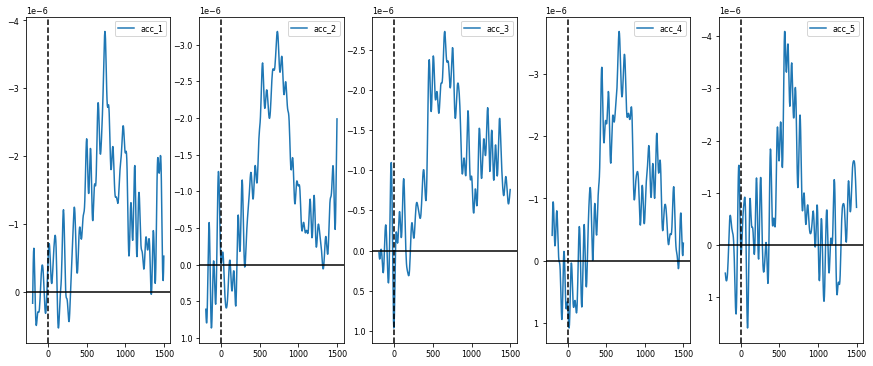

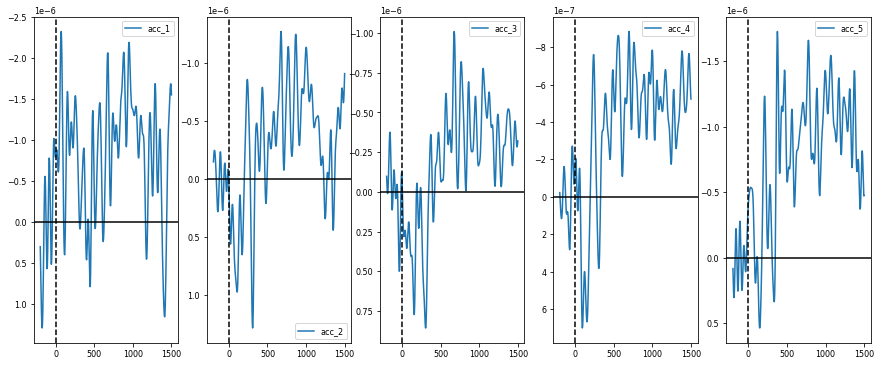

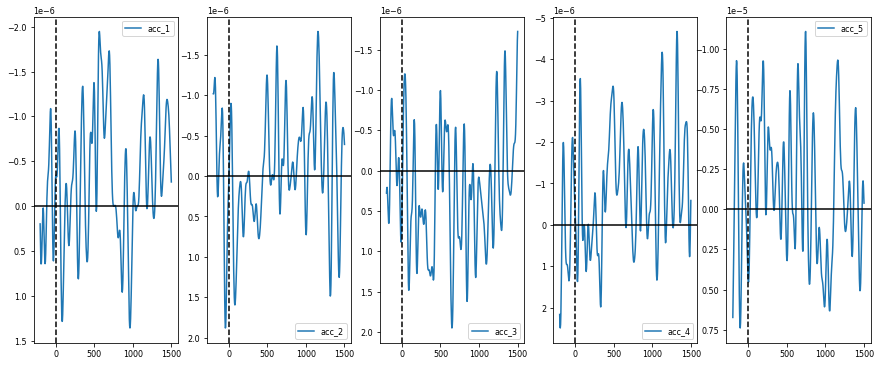

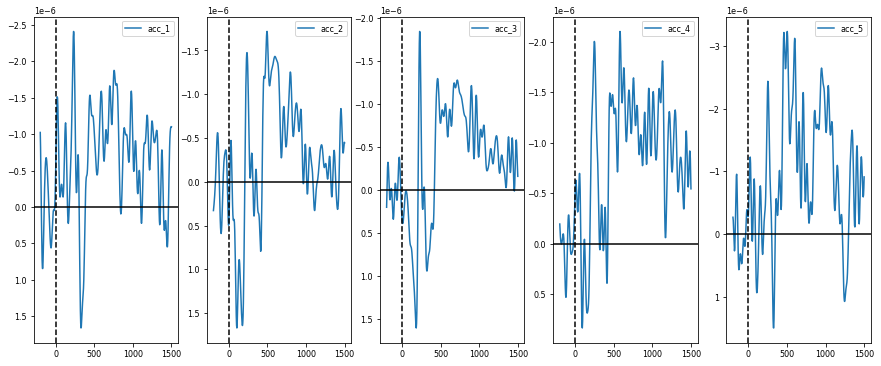

...

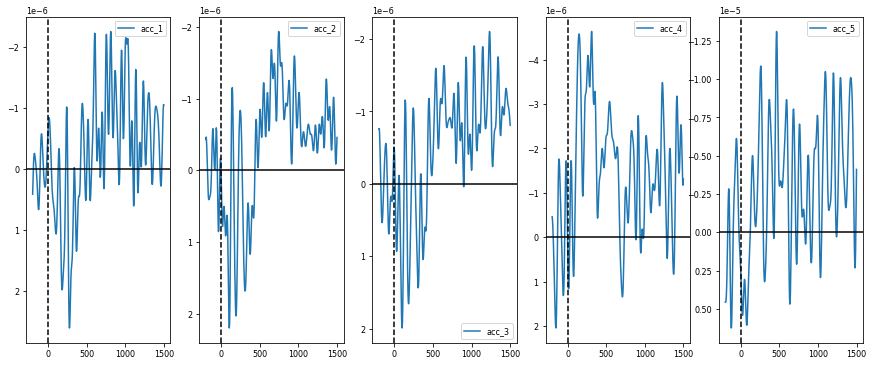

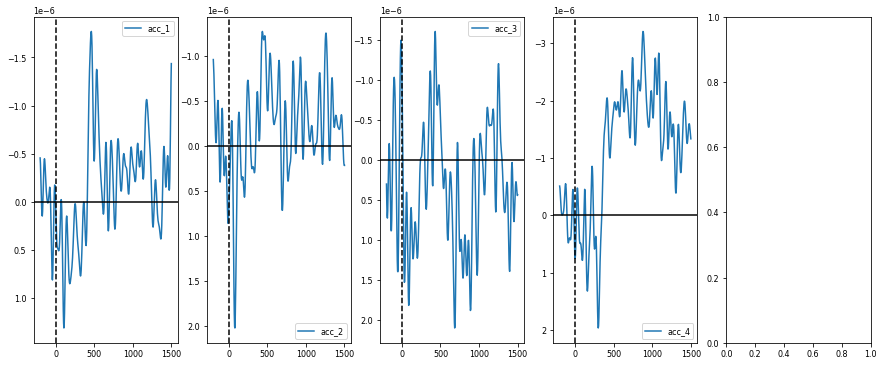

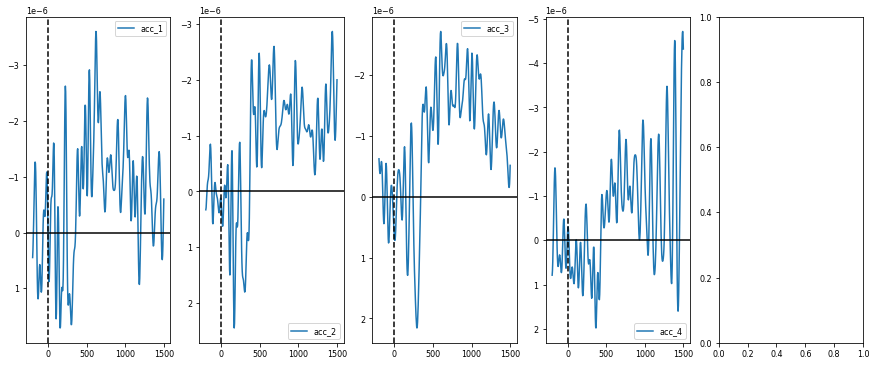

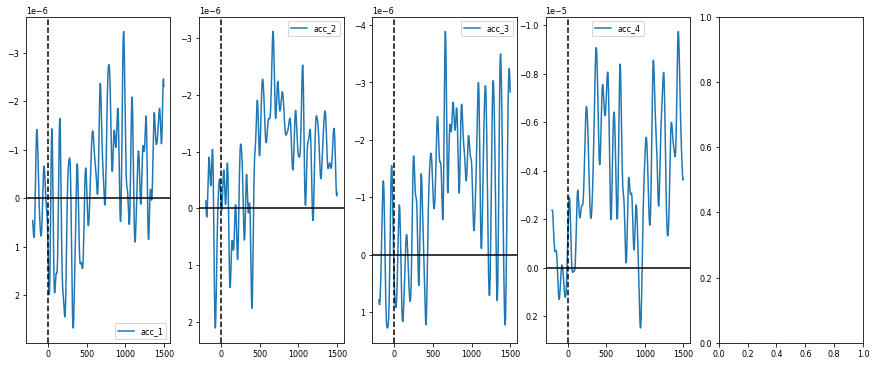

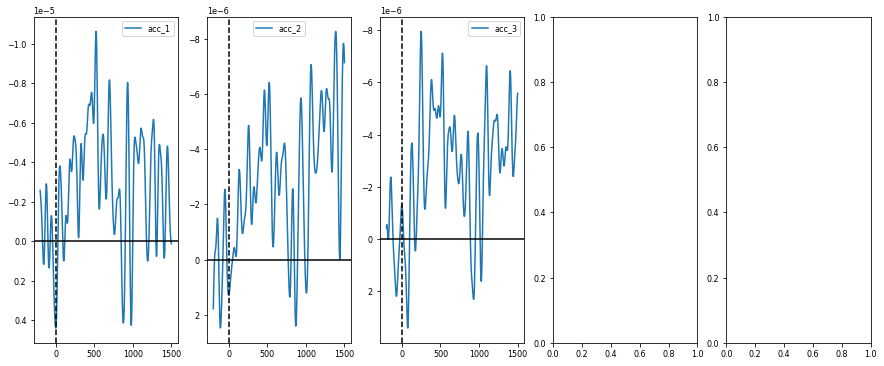

In [33]:
plt.rcParams.update({'font.size': 16})
cond = '6'

for acc in accs:
    plt.figure(figsize=(15, 6), dpi=80)
    means = np.nanmean(cda_all[cond][acc], 0)
    stds = np.nanstd(cda_all[cond][acc], 0)
    plt.plot((times * 1000), means, label=acc)
    plt.fill_between((times * 1000), means-stds,means+stds,alpha=.2)

    plt.axvline(x=0, color='k', linestyle='--')
    plt.gca().invert_yaxis()
    plt.legend()
    plt.show()

plt.rcParams.update({'font.size': 8})
for acc in accs:
    plt.figure(figsize=(15, 6), dpi=80)
    for i in range(len(cda_all[cond][acc])):
        plt.plot((times * 1000), cda_all[cond][acc][i,:], label='{}'.format(i))

    plt.title(acc)
    plt.axvline(x=0, color='k', linestyle='--')
    plt.gca().invert_yaxis()
    #plt.legend()
    plt.show()

plt.rcParams.update({'font.size': 8})
#plt.figure(figsize=(15, 6), dpi=80)
new_accs = [acc for acc in accs if (acc != 'acc_0') and (acc != 'acc_6')]
for subject in range(len(cda_all[conds[0]]['acc_3'])):
    fig, axs = plt.subplots(1, len(new_accs), figsize=(15,6))
    for i, acc in enumerate(new_accs):
        if (acc != 'acc_0') and (acc != 'acc_6'):
            if subject < len(cda_all[cond][acc]):
                axs[i].plot((times * 1000), cda_all[cond][acc][subject,:], label='{}'.format(acc))
                axs[i].axvline(x=0, color='k', linestyle='--')
                axs[i].axhline(y=0, color='k', linestyle='-')
                axs[i].invert_yaxis()
                axs[i].legend()

plt.show()

## Analysis - Performance Report (CDA per Subject)

In [ ]:
report = report.loc[:,~report.columns.duplicated()]

## Subjects: Perf (Good/Bad) vs CDA Amp

In [ ]:
plt.rcParams.update({'font.size': 10})

fig, axs = plt.subplots(1, len(conds), figsize=(15,4))

for i, cond in enumerate(conds):
    x = range(len(report['{}-right-good-CDA'.format(cond)]))
    
    # Good
    y = (report['{}-right-good-CDA'.format(cond)] + report['{}-left-good-CDA'.format(cond)]) / 2
    axs[i].scatter(x=x, y=y, color='blue', label='Good')
    axs[i].axhline(y=np.nanmean(y), color='blue', linestyle='--')
    # Bad
    y = (report['{}-right-bad-CDA'.format(cond)] + report['{}-left-bad-CDA'.format(cond)]) / 2
    axs[i].scatter(x=x, y=y, color='red', label='Bad')
    axs[i].axhline(y=np.nanmean(y), color='red', linestyle='--')
    
    axs[i].set_title('{} G vs B'.format(cond))
    axs[i].invert_yaxis()
    
axs[0].legend()
axs[0].set_ylabel('Mean CDA Amplitude')
    

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(14,6))

# Data
goods = np.array(report['good-CDA'])
bads = np.array(report['bad-CDA'])

# Calculate the average
goods_mean = np.nanmean(goods)
bads_mean = np.nanmean(bads)

# Calculate the standard deviation
goods_std = np.nanstd(goods)
bads_std = np.nanstd(bads)

# Define labels, positions, bar heights and error bar heights
labels = ['Good', 'Bad']
x_pos = np.arange(len(labels))
CTEs = [goods_mean, bads_mean]
error = [goods_std, bads_std]

# Build the plot
axs[0].bar(x_pos, CTEs,
       yerr=error,
       align='center',
       alpha=0.5,
       ecolor='black',
       capsize=10)
axs[0].set_ylabel('Mean Amp')
axs[0].set_xticks(x_pos)
axs[0].set_xticklabels(labels)
axs[0].set_title('Mean Amp vs # Perf')
axs[0].invert_yaxis()
#ax.yaxis.grid(True)

x = range(len(report['good-CDA']))
axs[1].scatter(x=x, y=report['good-CDA'], color='blue')
axs[1].axhline(y=np.nanmean(report['good-CDA']), color='blue', linestyle='--')
axs[1].scatter(x=x, y=report['bad-CDA'], color='red')
axs[1].axhline(y=np.nanmean(report['bad-CDA']), color='red', linestyle='--')

#plt.tight_layout()
plt.show()

import scipy
x = []
y = []
for p in perfs:
    for value in report['{}-CDA'.format(p)]:
        if p == 'good':
            x.append(1)
        else:
            x.append(2)
        y.append(value)

print('Corr Perf vs CDA Amp: {}'.format(scipy.stats.pearsonr(x,y)))

## Subjects: Condition vs CDA Amp

In [ ]:
plt.rcParams.update({'font.size': 12})

data_conds = dict()
for cond in conds:
    data_conds[cond] = dict()
    data_conds[cond]['data'] = np.array(report['{}-good-CDA'.format(cond)])
    data_conds[cond]['mean'] = np.nanmean(data_conds[cond]['data'])
    data_conds[cond]['std'] = np.nanstd(data_conds[cond]['data'])
    
labels = conds
x_pos = np.arange(len(labels))
CTEs = [data_conds[cond]['mean'] for cond in conds]
error = [data_conds[cond]['std'] for cond in conds]

fig, ax = plt.subplots()
ax.bar(x_pos, CTEs, yerr=error, align='center', alpha=0.5, ecolor='black', capsize=10)
ax.set_ylabel('Mean Amp')
ax.set_xticks(x_pos)
ax.set_xticklabels(labels)
ax.set_title('Cond vs CDA Amp')
ax.invert_yaxis()
#ax.yaxis.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Pearson's Correlation
import scipy
x = []
y = []
for i, ss in enumerate(['int', 'no_int']):
    for value in report['{}-good-CDA'.format(ss)]:
        x.append(i)
        y.append(value)

print('Corr int & no_int vs CDA Amp: {}'.format(scipy.stats.pearsonr(x,y)))

## Subjects: Side (Left/Right) vs CDA Amp

In [ ]:
plt.rcParams.update({'font.size': 16})

fig, axs = plt.subplots(1, 2, figsize=(15,6))

x = range(len(report['left-good-CDA']))
y= report['left-good-CDA']
axs[0].scatter(x=x, y=y, color='blue')
axs[0].axhline(y=np.nanmean(y), color='blue', linestyle='--')
x = range(len(report['left-bad-CDA']))
y= report['left-bad-CDA']
axs[0].scatter(x=x, y=y, color='red')
axs[0].axhline(y=np.nanmean(y), color='red', linestyle='--')
axs[0].set_title('Left Good vs Bad')

x = range(len(report['right-good-CDA']))
y= report['right-good-CDA']
axs[1].scatter(x=x, y=y, color='blue')
axs[1].axhline(y=np.nanmean(y), color='blue', linestyle='--')
x = range(len(report['right-bad-CDA']))
y= report['right-bad-CDA']
axs[1].scatter(x=x, y=y, color='red')
axs[1].axhline(y=np.nanmean(y), color='red', linestyle='--')
axs[1].set_title('Right Good vs Bad')

x = []
y = []
for i, side in enumerate(sides):
    for value in report['{}-good-CDA'.format(side)]:
        x.append(i)
        y.append(value)

print('Corr Side vs CDA Amp: {}'.format(scipy.stats.pearsonr(x,y)))

## Subjects: Accuracy / Performance vs CDA Amp

In [ ]:
plt.rcParams.update({'font.size': 10})

fig, axs = plt.subplots(1, len(conds), figsize=(15,4))

for i, cond in enumerate(conds):
    goods = (report['{}-left-good'.format(cond)] + report['{}-right-good'.format(cond)])/2
    bads = (report['{}-left-bad'.format(cond)] + report['{}-right-bad'.format(cond)])/2
    x = goods / (goods + bads)
    y = report['{}-left-good-CDA'.format(cond)] + report['{}-right-good-CDA'.format(cond)]
    axs[i].scatter(x=x, y=y, color='blue')
    axs[i].invert_yaxis()
    axs[i].set_title('{}'.format(cond))
    
    print('Corr Perf Acc ~ {}: {}'.format(cond, scipy.stats.pearsonr(x,y)))

axs[0].set_ylabel('CDA Mean Amp')

## Trials: Conditions vs Amp

In [ ]:
plt.figure(figsize=(15, 6), dpi=80)

for i, cond in enumerate(conds):
    y1 = []
    for f in perf_report_all.keys():
        for side in sides:
            for value in perf_report_all[f][cond][side]['good']:
                y1.append(value)
    x1 = range(len(y1))

    plt.scatter(x=x1, y=y1, label='{} Target(s)'.format(cond))

plt.ylim(-2.5*1e-5,2.5*1e-5)
plt.legend()
plt.show()

## Trials: Good vs Bad

In [ ]:
plt.rcParams.update({'font.size': 10})

fig, axs = plt.subplots(1, len(conds), figsize=(15,6))

for i, cond in enumerate(conds):
    y1 = []
    for f in perf_report_all.keys():
        for value in perf_report_all[f][cond]['left']['good']:
            y1.append(value)
        for value in perf_report_all[f][cond]['right']['good']:
            y1.append(value)
    x1 = range(len(y1))

    y2 = []
    for f in perf_report_all.keys():
        if 'bad' in perf_report_all[f][cond]['left'].keys():
            for value in perf_report_all[f][cond]['left']['bad']:
                y2.append(value)
        if 'bad' in perf_report_all[f][cond]['right'].keys():
            for value in perf_report_all[f][cond]['right']['bad']:
                y2.append(value)
    x2 = range(len(y2))

    axs[i].scatter(x=x1, y=y1, label='Good Perf Trials')
    axs[i].scatter(x=x2, y=y2, label='Bad Perf Trials')
    axs[i].legend()
    axs[i].set_ylim(-2.5*1e-5,2.5*1e-5)
    axs[i].set_title('{} Target(s)'.format(cond))

    nb_outliers = len([val for val in (y1 + y2) if ((val*1e5) > 2.5) or ((val*1e5) < -2.5)])
    print('Cond = {} Targets: {} Good Perf Trials vs {} Bad Perf Trials, with {} outliers on graph.'.format(cond, len(y1), len(y2), nb_outliers))

axs[1].set_xlabel('Trial #')
axs[0].set_ylabel('CDA mean amplitude')
#fig.tight_layout(pad=1.0)

## Trials: Left vs Right

In [ ]:
fig, axs = plt.subplots(1, len(conds), figsize=(15,6))

for i, cond in enumerate(conds):
    y1 = []
    for f in perf_report_all.keys():
        for value in perf_report_all[f][cond]['left']['good']:
            y1.append(value)
    x1 = range(len(y1))

    y2 = []
    for f in perf_report_all.keys():
        for value in perf_report_all[f][cond]['right']['good']:
            y2.append(value)
    x2 = range(len(y2))

    axs[i].scatter(x=x1, y=y1, label='Left (Good)')
    axs[i].scatter(x=x2, y=y2, label='Right (Good)')
    axs[i].legend()
    axs[i].set_title('{} Target(s)'.format(cond))
    axs[i].set_ylim(-2.5*1e-5,2.5*1e-5)

    nb_outliers = len([val for val in (y1 + y2) if ((val*1e5) > 2.5) or ((val*1e5) < -2.5)])
    print('Cond = {} Targets: {} Good Left Trials vs {} Good Right Trials, with {} outliers on graph'.format(cond, len(y1), len(y2), nb_outliers))
        

In [27]:
from scipy.io import loadmat

matfile = '/Volumes/Nick - Data/CDA Datasets/Adam 2018/Experiment 2/YR Temp/adam2018-exp2-sub2-trialAcc.mat'
trialAcc = loadmat(matfile)['trialAcc']
trialAccs = [acc for dim1 in trialAcc for acc in dim1]
print('{} vs {}'.format(len(trialAccs), trialAcc.shape))

540 vs (30, 18)


## Cowan's K Score
From a repo on github in R for a N-Back task.

Ncwk <- cowan.k(hits=hits, misses=misses, fas=fas, crs=crs, N=N)

get the numbers of hits, misses, false alarms and correct rejections:
hits   <- length(which(Ndf$correct == TRUE  & Ndf$target == 'present'))
misses <- length(which(Ndf$correct == FALSE & Ndf$target == 'present'))
fas    <- length(which(Ndf$correct == FALSE & Ndf$target == 'absent'))
crs    <- length(which(Ndf$correct == TRUE  & Ndf$target == 'absent'))
    
cowan.k <- function(hits, misses, fas, crs, N) {
  
  hit_rate <- hits / (hits + misses)
  cr_rate  <- crs  / (crs  + fas)
  
  K <- (hit_rate + cr_rate - 1) * N
  
  return(K)
  
}

# Reproducing Stats (Mean Acc vs CDA Amp) - from their .mat file!
In their paper they removed 4 subjects from E1 because they didn't have >100 trials with SS6

In [101]:
from mat73 import loadmat

# From E2
matfile = '/Volumes/Nick - Data/CDA Datasets/Adam 2018/Plots/E2_corr_data.mat'
matfile_data_E2 = loadmat(matfile)['E2']
matfile_meanacc_E2 = [matfile_data_E2[i,6] for i in range(len(matfile_data_E2))]
matfile_cda_E2 = [matfile_data_E2[i,4] for i in range(len(matfile_data_E2))]
matfile_nbtrials_E2 = [matfile_data_E2[i,3] for i in range(len(matfile_data_E2))]
matfile_subjects_E2 = [matfile_data_E2[i,1] for i in range(len(matfile_data_E2))]

# From E1
matfile = '/Volumes/Nick - Data/CDA Datasets/Adam 2018/Plots/E1_corr_data.mat'
matfile_data_E1 = loadmat(matfile)['E1']
matfile_meanacc_E1 = [matfile_data_E1[i,6] for i in range(len(matfile_data_E1))]
matfile_cda_E1 = [matfile_data_E1[i,4] for i in range(len(matfile_data_E1))]
matfile_nbtrials_E1 = [matfile_data_E1[i,3] for i in range(len(matfile_data_E1))]
matfile_subjects_E1 = [matfile_data_E1[i,1] for i in range(len(matfile_data_E1))]

bCleanUpRemaining = True
while bCleanUpRemaining:
    bCleanUpRemaining = False
    for i in range(len(matfile_meanacc_E1)):
        if np.isnan(matfile_meanacc_E1[i]) or np.isnan(matfile_cda_E1[i]) or (matfile_nbtrials_E1[i] < 100):
            print('Removing Subject: {}'.format(matfile_subjects_E1[i]))
            del matfile_meanacc_E1[i]
            del matfile_cda_E1[i]
            del matfile_nbtrials_E1[i]
            del matfile_subjects_E1[i]
            bCleanUpRemaining = True
            break

Cleaning Attempt
Removing Subject: 15.0
Cleaning Attempt
Removing Subject: 18.0
Cleaning Attempt
Removing Subject: 26.0
Cleaning Attempt
Removing Subject: 28.0
Cleaning Attempt


### Mean Acc vs CDA Amp - E1

----------------------------------------------------
Corr Acc/Perf vs CDA Amp (Good): (-0.2490695139454955, 0.09896154816943521)
----------------------------------------------------


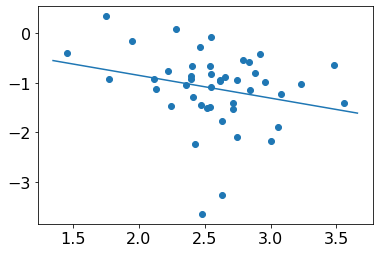

In [102]:
import scipy
from scipy.stats import linregress

x = matfile_meanacc_E2
y = matfile_cda_E2

print('----------------------------------------------------')
print('Corr Acc/Perf vs CDA Amp (Good): {}'.format(scipy.stats.pearsonr(x,y)))
print('----------------------------------------------------')

plt.scatter(x=x, y=y)

slope, intercept, r_value, p_value, std_err = linregress(x, y)

x_lim = plt.xlim()
xp = np.linspace(x_lim[0], x_lim[1], 10)
yp = xp*slope+intercept
plt.plot(xp, yp)

### Mean K vs CDA Amp - E1

----------------------------------------------------
Corr Acc/Perf vs CDA Amp (Good): (-0.3063063043690524, 0.1202027984211803)
----------------------------------------------------


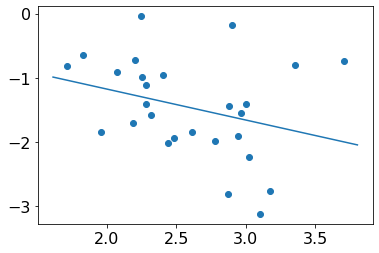

In [103]:
import scipy
from scipy.stats import linregress

x = matfile_meanacc_E1
y = matfile_cda_E1

print('----------------------------------------------------')
print('Corr Acc/Perf vs CDA Amp (Good): {}'.format(scipy.stats.pearsonr(x,y)))
print('----------------------------------------------------')

plt.scatter(x=x, y=y)

slope, intercept, r_value, p_value, std_err = linregress(x, y)

x_lim = plt.xlim()
xp = np.linspace(x_lim[0], x_lim[1], 10)
yp = xp*slope+intercept
plt.plot(xp, yp)

### Mean K vs CDA Amp - E1 + E2 (Combined)

----------------------------------------------------
Corr Acc vs CDA Amp: (-0.27075565031841886, 0.02142680524044598)
Total Subjects: 72 (30 from E1 + 45 from E2)
----------------------------------------------------


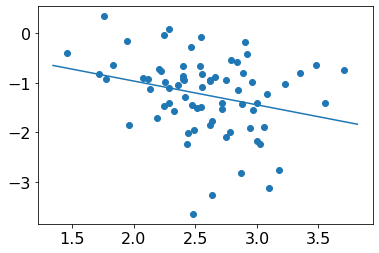

In [104]:
import scipy
from scipy.stats import linregress

x = matfile_meanacc_E1 + matfile_meanacc_E2
y = matfile_cda_E1 + matfile_cda_E2

print('----------------------------------------------------')
print('Corr Acc vs CDA Amp: {}'.format(scipy.stats.pearsonr(x,y)))
print('Total Subjects: {} ({} from E1 + {} from E2)'.format(len(x), len(matfile_meank_E1), len(matfile_meank_E2)))
print('----------------------------------------------------')

plt.scatter(x=x, y=y)

slope, intercept, r_value, p_value, std_err = linregress(x, y)

x_lim = plt.xlim()
xp = np.linspace(x_lim[0], x_lim[1], 10)
yp = xp*slope+intercept
plt.plot(xp, yp)

# Reproducing with my Acc and my CDA

In [125]:
subs_meanacc = dict()

subjects = report.index
for sub in subjects:
    sum_acc = 0
    
    sub_accs_dist = []
    for acc in accs:
        cur_accs = [int(acc[-1]) for i in range(report.at[sub, acc])]
        sub_accs_dist = sub_accs_dist + cur_accs
        sum_acc = sum_acc + report.at[sub, '{}'.format(acc)]
        
    sub_mean_acc = np.mean(sub_accs_dist)
    print('Subject {}:\t Trials {} vs {} \t|   Mean Acc: {:.2f}' .format(sub[:sub.find('_')], report.at[sub,'6'], sum_acc, sub_mean_acc))
    
    subs_meanacc[sub] = sub_mean_acc

Subject 10:	 Trials 510 vs 510 	|   Mean Acc: 2.40
Subject 11:	 Trials 540 vs 540 	|   Mean Acc: 2.54
Subject 12:	 Trials 540 vs 540 	|   Mean Acc: 3.48
Subject 13:	 Trials 540 vs 540 	|   Mean Acc: 1.95
Subject 14:	 Trials 540 vs 540 	|   Mean Acc: 2.89
Subject 15:	 Trials 540 vs 540 	|   Mean Acc: 2.71
Subject 16:	 Trials 451 vs 451 	|   Mean Acc: 2.36
Subject 17:	 Trials 540 vs 540 	|   Mean Acc: 2.12
Subject 19:	 Trials 105 vs 105 	|   Mean Acc: 1.49
Subject 1:	 Trials 540 vs 540 	|   Mean Acc: 3.00
Subject 20:	 Trials 540 vs 540 	|   Mean Acc: 3.06
Subject 21:	 Trials 301 vs 301 	|   Mean Acc: 2.79
Subject 22:	 Trials 540 vs 540 	|   Mean Acc: 2.43
Subject 23:	 Trials 420 vs 420 	|   Mean Acc: 2.41
Subject 24:	 Trials 540 vs 540 	|   Mean Acc: 2.40
Subject 25:	 Trials 540 vs 540 	|   Mean Acc: 2.54
Subject 26:	 Trials 540 vs 540 	|   Mean Acc: 3.23
Subject 27:	 Trials 540 vs 540 	|   Mean Acc: 2.40
Subject 28:	 Trials 540 vs 540 	|   Mean Acc: 2.62
Subject 29:	 Trials 540 vs 540 	

In [145]:
# Get Mean CDA Amplitude from each subject
subs_meancda = dict()

subjects = report.index
for sub in subjects:
    subs_meancda[sub] = 0
    for acc in accs:
        # Ponderated Average. Would be best if we re-compute from each trials... (should lead to similar results)
        if (report.at[sub, acc] > 0) and (~np.isnan(report.at[sub, '{}-CDA'.format(acc)])):
            subs_meancda[sub] = subs_meancda[sub] + ((report.at[sub, acc] / report.at[sub, '6']) * report.at[sub, '{}-CDA'.format(acc)])

for sub in subs_meancda:
    print('Subject {}, Mean CDA: {:.2f}'.format(sub[:sub.find('_')], subs_meancda[sub]))

Subject 10, Mean CDA: -0.53
Subject 11, Mean CDA: -1.40
Subject 12, Mean CDA: -0.50
Subject 13, Mean CDA: -0.23
Subject 14, Mean CDA: -0.74
Subject 15, Mean CDA: -1.39
Subject 16, Mean CDA: -0.86
Subject 17, Mean CDA: -0.80
Subject 19, Mean CDA: -0.88
Subject 1, Mean CDA: -2.00
Subject 20, Mean CDA: -1.76
Subject 21, Mean CDA: -0.39
Subject 22, Mean CDA: -1.86
Subject 23, Mean CDA: -1.23
Subject 24, Mean CDA: -0.90
Subject 25, Mean CDA: -0.40
Subject 26, Mean CDA: -0.77
Subject 27, Mean CDA: -0.75
Subject 28, Mean CDA: -0.66
Subject 29, Mean CDA: -0.99
Subject 2, Mean CDA: -1.10
Subject 30, Mean CDA: -1.05
Subject 31, Mean CDA: -0.73
Subject 32, Mean CDA: 0.02
Subject 34, Mean CDA: -1.24
Subject 35, Mean CDA: 0.39
Subject 36, Mean CDA: -0.40
Subject 37, Mean CDA: -1.32
Subject 18, Mean CDA: -0.83
Subject 33, Mean CDA: -1.84
Subject 4, Mean CDA: -0.26
Subject 38, Mean CDA: -0.87
Subject 39, Mean CDA: -1.10
Subject 3, Mean CDA: -1.56
Subject 40, Mean CDA: -3.33
Subject 41, Mean CDA: -0.3

----------------------------------------------------
Corr Acc vs CDA Amp: (-0.31343002389002317, 0.030063453667539593)
----------------------------------------------------


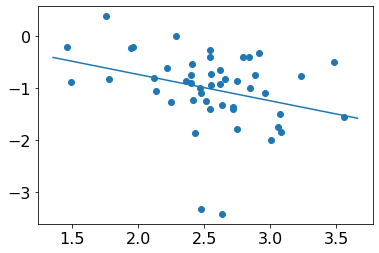

In [146]:
import scipy
from scipy.stats import linregress

x = list(subs_meanacc.values())
y = list(subs_meancda.values())

print('----------------------------------------------------')
print('Corr Acc vs CDA Amp: {}'.format(scipy.stats.pearsonr(x,y)))
print('----------------------------------------------------')

plt.scatter(x=x, y=y)

slope, intercept, r_value, p_value, std_err = linregress(x, y)

x_lim = plt.xlim()
xp = np.linspace(x_lim[0], x_lim[1], 10)
yp = xp*slope+intercept
plt.plot(xp, yp)

In [147]:
study_id = 'Adam2018-Exp1'
with open("../../Exp1/1 - Full Analysis/{}_clean-20hz.pkl".format(study_id),"rb") as f:
    data_pickle = pickle.load(f)

report_E1 = copy.deepcopy(data_pickle['report'])

del data_pickle

In [148]:
report_E1

,1,3,6,left,right,acc_0,acc_1,acc_2,acc_3,acc_4,...,right-acc_6-CDA,checksum,notes,acc_0-CDA,acc_1-CDA,acc_2-CDA,acc_3-CDA,acc_4-CDA,acc_5-CDA,acc_6-CDA
10_DWR_Bilateral.set,230,228,230,344,344,34,269,111,233,31,...,NaN,1,,0.019657,-1.573969,-1.213303,-1.609757,-1.357776,-1.439571,-5.80728
11_DWR_Bilateral.set,200,200,198,299,299,43,247,100,172,28,...,NaN,0,0,-1.136774,-1.264008,-1.387017,-1.328460,-0.600970,0.079562,NaN
12_DWR_Bilateral.set,200,201,200,301,300,24,261,152,141,20,...,NaN,0,0,-0.013057,-1.052814,-0.770062,-0.848068,1.472428,-1.346211,NaN
13_DWR_Bilateral.set,271,270,270,405,406,10,278,78,349,71,...,-2.100462,0,0,0.144819,-0.770893,-2.387429,-2.308224,-2.100535,-1.945798,-0.365846
14_DWR_Bilateral.set,196,197,196,292,297,24,258,132,162,12,...,NaN,0,0,-0.739938,-2.051605,-1.525779,-1.651763,-4.084139,-1.234502,NaN
15_DWR_Bilateral.set,97,95,98,145,145,15,137,45,80,11,...,NaN,0,0,1.341807,-0.385177,-1.798799,-1.500238,0.498209,-1.064690,NaN
16_DWR_Bilateral.set,230,230,231,345,346,29,252,114,217,56,...,5.005857,0,0,-0.650692,-1.385385,-0.742165,-0.976952,-2.923653,-1.187712,3.28534
18_DWR_Bilateral.set,200,200,200,300,300,14,250,135,175,23,...,NaN,0,0,-0.938660,-1.544560,-1.220958,-1.899118,-0.440344,-1.538501,NaN
19_DWR_Bilateral.set,230,231,230,346,345,27,271,113,224,44,...,NaN,0,0,1.097960,-2.793319,-2.018894,-1.523791,-3.447569,-3.494167,NaN
1_DWR_Bilateral.set,200,202,200,302,300,18,241,145,180,15,...,NaN,0,0,-1.590912,-0.797165,-1.761793,-1.024074,-1.390221,-0.947606,NaN


In [152]:
for k in report_E1.loc['10_DWR_Bilateral.set'].keys():
    print(k)

1
3
6
left
right
acc_0
acc_1
acc_2
acc_3
acc_4
acc_5
acc_6
1-left
1-left-CDA
1-left-acc_0
1-left-acc_0-CDA
left-acc_0-CDA
1-acc_0
1-acc_0-CDA
1-left-acc_1
1-left-acc_1-CDA
left-acc_1-CDA
1-acc_1
1-acc_1-CDA
1-left-acc_2
1-left-acc_2-CDA
left-acc_2-CDA
1-acc_2
1-acc_2-CDA
1-left-acc_3
1-left-acc_3-CDA
left-acc_3-CDA
1-acc_3
1-acc_3-CDA
1-left-acc_4
1-left-acc_4-CDA
left-acc_4-CDA
1-acc_4
1-acc_4-CDA
1-left-acc_5
1-left-acc_5-CDA
left-acc_5-CDA
1-acc_5
1-acc_5-CDA
1-left-acc_6
1-left-acc_6-CDA
left-acc_6-CDA
1-acc_6
1-acc_6-CDA
1-right
1-right-CDA
1-right-acc_0
1-right-acc_0-CDA
right-acc_0-CDA
1-right-acc_1
1-right-acc_1-CDA
right-acc_1-CDA
1-right-acc_2
1-right-acc_2-CDA
right-acc_2-CDA
1-right-acc_3
1-right-acc_3-CDA
right-acc_3-CDA
1-right-acc_4
1-right-acc_4-CDA
right-acc_4-CDA
1-right-acc_5
1-right-acc_5-CDA
right-acc_5-CDA
1-right-acc_6
1-right-acc_6-CDA
right-acc_6-CDA
3-left
3-left-CDA
3-left-acc_0
3-left-acc_0-CDA
left-acc_0-CDA
3-acc_0
3-acc_0-CDA
3-left-acc_1
3-left-acc_1-CDA

In [154]:
subs_meanacc_E1 = dict()

subjects = report_E1.index
for sub in subjects:
    sum_acc = 0
    
    sub_accs_dist = []
    for acc in accs:
        cur_accs = [int(acc[-1]) for i in range(report_E1.at[sub, '6-{}'.format(acc)])]
        sub_accs_dist = sub_accs_dist + cur_accs
        sum_acc = sum_acc + report_E1.at[sub, '6-{}'.format(acc)]
        
    sub_mean_acc = np.mean(sub_accs_dist)
    print('Subject {}:\t Trials {} vs {} \t|   Mean Acc: {:.2f}' .format(sub[:sub.find('_')], report_E1.at[sub,'6'], sum_acc, sub_mean_acc))
    
    subs_meanacc_E1[sub] = sub_mean_acc

Subject 10:	 Trials 230 vs 230 	|   Mean Acc: 2.49
Subject 11:	 Trials 198 vs 198 	|   Mean Acc: 2.26
Subject 12:	 Trials 200 vs 200 	|   Mean Acc: 2.25
Subject 13:	 Trials 270 vs 270 	|   Mean Acc: 3.18
Subject 14:	 Trials 196 vs 196 	|   Mean Acc: 2.18
Subject 15:	 Trials 98 vs 98 	|   Mean Acc: 1.97
Subject 16:	 Trials 231 vs 231 	|   Mean Acc: 3.00
Subject 18:	 Trials 200 vs 200 	|   Mean Acc: 2.35
Subject 19:	 Trials 230 vs 230 	|   Mean Acc: 2.62
Subject 1:	 Trials 200 vs 200 	|   Mean Acc: 2.29
Subject 20:	 Trials 210 vs 210 	|   Mean Acc: 2.20
Subject 21:	 Trials 137 vs 137 	|   Mean Acc: 1.96
Subject 22:	 Trials 240 vs 240 	|   Mean Acc: 1.83
Subject 23:	 Trials 250 vs 250 	|   Mean Acc: 2.28
Subject 24:	 Trials 240 vs 240 	|   Mean Acc: 2.22
Subject 25:	 Trials 200 vs 200 	|   Mean Acc: 2.40
Subject 26:	 Trials 181 vs 181 	|   Mean Acc: 1.56
Subject 27:	 Trials 230 vs 230 	|   Mean Acc: 2.97
Subject 28:	 Trials 181 vs 181 	|   Mean Acc: 1.72
Subject 17:	 Trials 238 vs 238 	| 

In [165]:
# Get Mean CDA Amplitude from each subject
subs_meancda_E1 = dict()

subjects = report_E1.index
for sub in subjects:
    subs_meancda_E1[sub] = 0
    for acc in accs:
        # Ponderated Average. Would be best if we re-compute from each trials... (should lead to similar results)
        if (report_E1.at[sub, acc] > 0) and (~np.isnan(report_E1.at[sub, '{}-CDA'.format(acc)])):
            subs_meancda_E1[sub] = subs_meancda_E1[sub] + ((report_E1.at[sub, '6-{}'.format(acc)] / report_E1.at[sub, '6']) * report_E1.at[sub, '{}-CDA'.format(acc)])

for sub in subs_meancda_E1:
    print('Subject {}, Mean CDA: {:.2f}'.format(sub[:sub.find('_')], subs_meancda_E1[sub]))

Subject 10, Mean CDA: -1.40
Subject 11, Mean CDA: -1.15
Subject 12, Mean CDA: -0.59
Subject 13, Mean CDA: -2.12
Subject 14, Mean CDA: -1.81
Subject 15, Mean CDA: -0.73
Subject 16, Mean CDA: -1.40
Subject 18, Mean CDA: -1.35
Subject 19, Mean CDA: -2.23
Subject 1, Mean CDA: -1.30
Subject 20, Mean CDA: -0.55
Subject 21, Mean CDA: -1.22
Subject 22, Mean CDA: -0.49
Subject 23, Mean CDA: -1.78
Subject 24, Mean CDA: -0.27
Subject 25, Mean CDA: -0.54
Subject 26, Mean CDA: -0.73
Subject 27, Mean CDA: -1.59
Subject 28, Mean CDA: -0.97
Subject 17, Mean CDA: -2.58
Subject 3, Mean CDA: -0.75
Subject 29, Mean CDA: -1.02
Subject 2, Mean CDA: -0.85
Subject 30, Mean CDA: -1.90
Subject 31, Mean CDA: -0.99
Subject 4, Mean CDA: -0.81
Subject 5, Mean CDA: -0.66
Subject 6, Mean CDA: -1.87
Subject 7, Mean CDA: -1.54
Subject 8, Mean CDA: -2.55
Subject 9, Mean CDA: -0.70


----------------------------------------------------
Corr Acc vs CDA Amp: (-0.360953046845732, 0.046049072250208684)
----------------------------------------------------


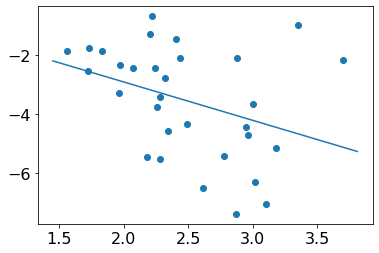

In [156]:
import scipy
from scipy.stats import linregress

x = list(subs_meanacc_E1.values())
y = list(subs_meancda_E1.values())

print('----------------------------------------------------')
print('Corr Acc vs CDA Amp: {}'.format(scipy.stats.pearsonr(x,y)))
print('----------------------------------------------------')

plt.scatter(x=x, y=y)

slope, intercept, r_value, p_value, std_err = linregress(x, y)

x_lim = plt.xlim()
xp = np.linspace(x_lim[0], x_lim[1], 10)
yp = xp*slope+intercept
plt.plot(xp, yp)

----------------------------------------------------
Corr Acc vs CDA Amp: (-0.34455401248972156, 0.0018743257307676277)
With 79 subjects.
----------------------------------------------------


Text(0.5, 0, 'Mean Accuracy (SS6)')

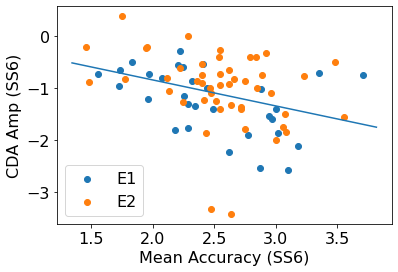

In [171]:
import scipy
from scipy.stats import linregress

x1 = list(subs_meanacc_E1.values())
x2 = list(subs_meanacc.values())
y1 = list(subs_meancda_E1.values())
y2 = list(subs_meancda.values())
x = x1 + x2 
y = y1 + y2 

print('----------------------------------------------------')
print('Corr Acc vs CDA Amp: {}'.format(scipy.stats.pearsonr(x,y)))
print('With {} subjects.'.format(len(y)))
print('----------------------------------------------------')

plt.scatter(x=x1, y=y1, label='E1')
plt.scatter(x=x2, y=y2, label='E2')

slope, intercept, r_value, p_value, std_err = linregress(x, y)

x_lim = plt.xlim()
xp = np.linspace(x_lim[0], x_lim[1], 10)
yp = xp*slope+intercept
plt.plot(xp, yp)
plt.legend()
plt.ylabel('CDA Amp (SS6)')
plt.xlabel('Mean Accuracy (SS6)')

In [166]:
cdas_E1 = list(subs_meancda_E1.values())
print(np.mean(cdas_E1))
print(np.std(cdas_E1))

print('------------------------------------')

cdas_E2 = list(subs_meancda.values())
print(np.mean(cdas_E2))
print(np.std(cdas_E2))

-1.2386382074440783
0.6169749641449155
------------------------------------
-1.0132949432397553
0.7130244630512115
